In [1]:
import numpy as np
import pandas
import matplotlib.pyplot as plt
import glob
import matplotlib as mpl
%matplotlib inline

In [2]:
Iax_dir = "/Users/tktakaro/Documents/Type-Iax-HST" #"D:/Research/Type-Iax-HST"
catalog = np.loadtxt(Iax_dir + "/images/sn2014ck/dolphot/dp.out")

In [3]:
pos_predict = np.zeros((catalog.shape[0],2))
info_predict = np.zeros(np.shape(catalog))

j = 0 # Iteration variable for positions array
for i in range(catalog.shape[0]): # Cycles through each object in catalog
    # Checks to make sure point is "good"
    # Good defined by: 1. S/N > 3     2. Sharpness < 3    3. Roundness < 1     4. Crowding < .1 
    #                  5. Object type = "Bright Star"     6. ML algorithm picks as good
    if ((catalog[i][5] >= 3)&(abs(catalog[i][6]) < .3)&(abs(catalog[i][7]) < 1)
        &(catalog[i][9] < .1)):
        pos_predict[j][0] = catalog[i][2] # Assigns X position
        pos_predict[j][1] = catalog[i][3] # Assigns Y position
        info_predict[j] = catalog[i]
        j = j + 1
                
# Trims all zeros from end of positions array, left from "bad" objects
pos_predict = pos_predict[~np.all(pos_predict == 0, axis=1)]
info_predict = info_predict[~np.all(info_predict == 0, axis=1)]

# Saves high S/N object X,Y positions
np.savetxt("Region_files/sn2014ck_Prediction.reg", pos_predict, '%5.2f')

In [4]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2014ck_200pc.reg", "r+")

def mysplit(s, delim=None):
    return [x for x in s.split(delim) if x]

text = asci.readlines()
region = np.zeros([28,2])
for i in range(28):
    A = mysplit(text[i+3], ' # ')
    if A[1][-2] == 'w':
        region[i][0] = mysplit(mysplit(A[0], 'point')[0],',')[0][1:]
        region[i][1] = mysplit(mysplit(A[0], 'point')[0],',')[1][:-1]
region = region[~np.all(region == 0, axis=1)]

# Info for each star chosen as real 
infoF3 = np.zeros([region.shape[0],info_predict.shape[1]])

j = 0 # Iteration variable for region array
for i in range(info_predict.shape[0]): # Cycles through each star predicted above
    if (region[j][0] == pos_predict[i][0])&(region[j][1] == pos_predict[i][1]):
        infoF3[j] = info_predict[i]
        j = j + 1
        if j == region.shape[0]: break

In [5]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2014ck_133pc.reg", "r+")

text = asci.readlines()
region = np.zeros([12,2])
for i in range(12):
    A = mysplit(text[i+3], ' # ')
    if A[1][-2] == 'w':
        region[i][0] = mysplit(mysplit(A[0], 'point')[0],',')[0][1:]
        region[i][1] = mysplit(mysplit(A[0], 'point')[0],',')[1][:-1]
region = region[~np.all(region == 0, axis=1)]

infoF2 = np.zeros([region.shape[0], info_predict.shape[1]])

j = 0 # Iteration variable for region array
for i in range(infoF3.shape[0]): # Cycles through each star predicted above
    if np.array_equal(region[j],infoF3[i][2:4]):
        infoF2[j] = infoF3[i]
        j = j + 1
        if j == region.shape[0]: break

In [6]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2014ck_67pc.reg", "r+")

text = asci.readlines()
region = np.zeros([1,2])
for i in range(1):
    A = mysplit(text[i+3], ' # ')
    if A[1][-2] == 'w':
        region[i][0] = mysplit(mysplit(A[0], 'point')[0],',')[0][1:]
        region[i][1] = mysplit(mysplit(A[0], 'point')[0],',')[1][:-1]
region = region[~np.all(region == 0, axis=1)]

infoF1 = np.zeros([region.shape[0], info_predict.shape[1]])

j = 0 # Iteration variable for region array
for i in range(infoF2.shape[0]): # Cycles through each star predicted above
    if np.array_equal(region[j],infoF2[i][2:4]):
        infoF1[j] = infoF2[i]
        j = j + 1
        if j == region.shape[0]: break

[-1, 4, 28, 22]

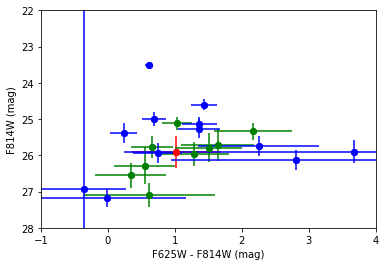

In [7]:
for i in range(infoF3.shape[0]):
    for j in range(infoF2.shape[0]):
        if np.array_equal(infoF3[i],infoF2[j]):
            infoF3[i] = np.zeros(infoF3[i].size)
for i in range(infoF2.shape[0]):
    for j in range(infoF1.shape[0]):
        if np.array_equal(infoF2[i],infoF1[j]):
            infoF2[i] = np.zeros(infoF2[i].size)

infoF2 = infoF2[~np.all(infoF2 == 0, axis=1)]
infoF3 = infoF3[~np.all(infoF3 == 0, axis=1)]

F625W_F1 = infoF1[:,15]
xerr2_F1 = np.sqrt(infoF1[:,17]**2 + infoF1[:,30]**2)
F814W_F1 = infoF1[:,28]
yerr2_F1 = infoF1[:,56]

F625W_F2 = infoF2[:,15]
xerr2_F2 = np.sqrt(infoF2[:,17]**2 + infoF2[:,30]**2)
F814W_F2 = infoF2[:,28]
yerr2_F2 = infoF2[:,56]

F625W_F3 = infoF3[:,15]
xerr2_F3 = np.sqrt(infoF3[:,17]**2 + infoF3[:,30]**2)
F814W_F3 = infoF3[:,28]
yerr2_F3 = infoF3[:,56]

line1 = plt.errorbar(F625W_F1 - F814W_F1, F814W_F1, fmt='ro', xerr=xerr2_F1, yerr=yerr2_F1)
line2 = plt.errorbar(F625W_F2 - F814W_F2, F814W_F2, fmt='go', xerr=xerr2_F2, yerr=yerr2_F2)
line3 = plt.errorbar(F625W_F3 - F814W_F3, F814W_F3, fmt='bo', xerr=xerr2_F3, yerr=yerr2_F3)

plt.plot(F625W_F1 - F814W_F1, F814W_F1, 'ro', F625W_F2 - F814W_F2, F814W_F2, 'go', F625W_F3 - F814W_F3, F814W_F3, 'bo')
plt.gca().invert_yaxis()
plt.xlabel('F625W - F814W (mag)')
plt.ylabel('F814W (mag)')
plt.axis([-1,4,28,22])

In [8]:
import os
import glob
import matplotlib as mpl

mist_dir = Iax_dir + "/MIST_v1.0_vvcrit0.4_HST_WFC3"
# All of this MIST isochrone code comes from Asher

In [9]:
kwargs = {"names": ["EEP", "log10_isochrone_age_yr", "initial_mass", "log_Teff", "log_g", "log_L",
                        "z_surf", "WFC3_UVIS_F200LP", "WFC3_UVIS_F218W", "WFC3_UVIS_F225W", "WFC3_UVIS_F275W",
                        "WFC3_UVIS_F280N", "WFC3_UVIS_F300X", "WFC3_UVIS_F336W", "WFC3_UVIS_F343N",
                        "WFC3_UVIS_F350LP", "WFC3_UVIS_F373N", "WFC3_UVIS_F390M", "WFC3_UVIS_F390W",
                        "WFC3_UVIS_F395N", "WFC3_UVIS_F410M", "WFC3_UVIS_F438W", "WFC3_UVIS_F467M",
                        "WFC3_UVIS_F469N", "WFC3_UVIS_F475W", "WFC3_UVIS_F475X", "WFC3_UVIS_F487N",
                        "WFC3_UVIS_F502N", "WFC3_UVIS_F547M", "WFC3_UVIS_F555W", "WFC3_UVIS_F600LP",
                        "WFC3_UVIS_F606W", "WFC3_UVIS_F621M", "WFC3_UVIS_F625W", "WFC3_UVIS_F631N",
                        "WFC3_UVIS_F645N", "WFC3_UVIS_F656N", "WFC3_UVIS_F657N", "WFC3_UVIS_F658N",
                        "WFC3_UVIS_F665N", "WFC3_UVIS_F673N", "WFC3_UVIS_F680N", "WFC3_UVIS_F689M",
                        "WFC3_UVIS_F763M", "WFC3_UVIS_F775W", "WFC3_UVIS_F814W", "WFC3_UVIS_F845M",
                        "WFC3_UVIS_F850LP", "WFC3_UVIS_F953N", "WFC3_IR_F098M", "WFC3_IR_F105W", "WFC3_IR_F110W",
                        "WFC3_IR_F125W", "WFC3_IR_F126N", "WFC3_IR_F127M", "WFC3_IR_F128N", "WFC3_IR_F130N",
                        "WFC3_IR_F132N", "WFC3_IR_F139M", "WFC3_IR_F140W", "WFC3_IR_F153M", "WFC3_IR_F160W",
                        "WFC3_IR_F164N", "WFC3_IR_F167N", "phase"],
            "delim_whitespace": True, "comment": "#"}
isochrones = {}
for filename in glob.glob(mist_dir + "/*.iso.cmd"):
    feh_string = filename.split("/")[-1].split("_")[3] # Pulls metalicity information
    if feh_string[0] == "p":
        feh = float(feh_string[1:]) # feh is [Fe/H]
    elif feh_string[0] == "m":
        feh = -float(feh_string[1:])
    else:
        raise ValueError
    df = pandas.read_csv(filename, **kwargs)
    df['ages'] = 10 ** df.log10_isochrone_age_yr / 1e9
    isochrones[feh] = df # Creates dictionary accessible by entering a particular metalicity

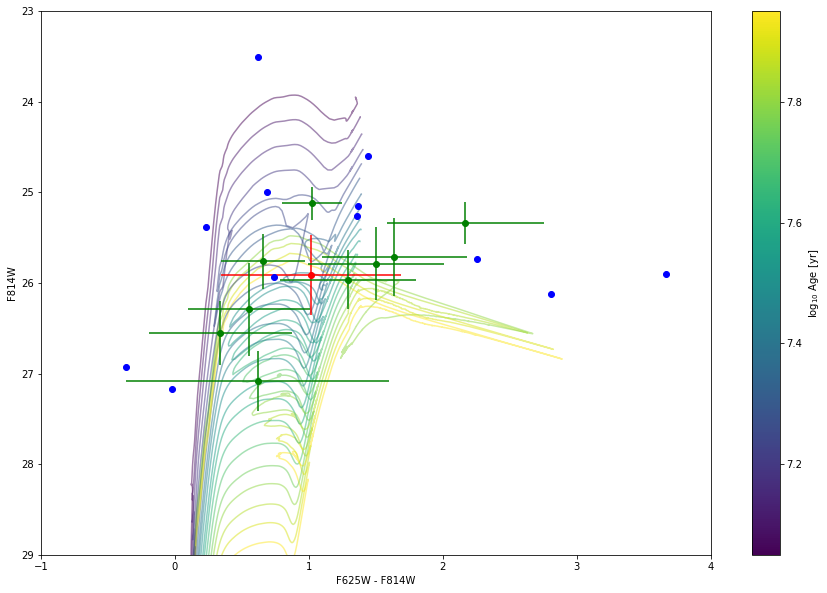

In [10]:
# fix metallicity, vary age
df = isochrones[-0.50]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}


ages = ages[(ages > 7) & (ages < 8)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Three adjustments: 1. Distance: added to mag 2. MW Extinction: added to both. 3. Galactic extinction
    dist_adjust = 5 * (np.log10(24.4e6) - 1)
    F625W_ext = 1.018 # extinction in F625W in UGC 12182 from NED
    F814W_ext = 0.700 # extinction in F814W in UGC 12182 from NED
    Gal_ext = 0
    mag = df[idx].WFC3_UVIS_F814W + dist_adjust + F814W_ext + 1.436*Gal_ext
    color = df[idx].WFC3_UVIS_F625W - df[idx].WFC3_UVIS_F814W + F625W_ext - F814W_ext + (2.259 - 1.436)*Gal_ext
    age_cmd[age] = (color, mag)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
# Plots stars
line1 = plt.errorbar(F625W_F1 - F814W_F1, F814W_F1, fmt='ro', xerr=xerr2_F1, yerr=yerr2_F1)
line2 = plt.errorbar(F625W_F2 - F814W_F2, F814W_F2, fmt='go', xerr=xerr2_F2, yerr=yerr2_F2)
#line3 = plt.errorbar(F625W_F3 - F814W_F3, F814W_F3, fmt='bo', xerr=xerr2_F3, yerr=yerr2_F3)
line3 = plt.plot(F625W_F3 - F814W_F3, F814W_F3, 'bo')

# Plots reddening vector
#plt.arrow(-0.5, 23.5, (2.259 - 1.436)*Gal_ext, 1.436*Gal_ext, head_width=0.05, head_length=0.1, fc='k', ec='k')

plt.xlabel("F625W - F814W")
plt.ylabel("F814W")
plt.ylim(29,23)
plt.xlim(-1, 4)
cb = plt.colorbar(sm)
cb.set_label('$\log_{10}$ Age [yr]')

# Removing clusters

In [11]:
# Using IRAF to compute actual concentration index, i.e. photometry at .5 pixels to photometry at 3 pixels
ascii_1 = open(Iax_dir + "/images/sn2014ck/sn2014ck_f625w_lacosmic.fits.mag.1")
ascii_2 = open(Iax_dir + "/images/sn2014ck/sn2014ck_f625w_lacosmic.fits.mag.2")
text_1 = ascii_1.readlines()
text_2 = ascii_2.readlines()

concentration = np.zeros(28)
for i in range(28):
    if mysplit(text_1[5*i + 79])[4] == 'INDEF': # Removes objects with no defined magnitude at .5 pixels
        concentration[i] = 99
    elif mysplit(text_2[5*i + 79])[4] == 'INDEF': # Removes objects with no defined magnitude at 3 pixels
        concentration[i] = -99
    else: concentration[i] = float(mysplit(text_1[5*i + 79])[4]) - float(mysplit(text_2[5*i + 79])[4])
ascii_1.close()
ascii_2.close()

In [12]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2014ck_200pc.reg", "r+")
text = asci.readlines()

region = np.zeros([28,2])
for i in range(28):
    A = mysplit(text[i+3], ' # ')
    region[i][0] = mysplit(mysplit(A[0], 'point')[0],',')[0][1:]
    region[i][1] = mysplit(mysplit(A[0], 'point')[0],',')[1][:-1]

# Info for each star chosen as real 
info = np.zeros([region.shape[0],info_predict.shape[1]])

j = 0 # Iteration variable for region array
for i in range(info_predict.shape[0]): # Cycles through each star predicted above
    if (region[j][0] == pos_predict[i][0])&(region[j][1] == pos_predict[i][1]):
        info[j] = info_predict[i]
        j = j + 1
        if j == region.shape[0]: break

(29, 23)

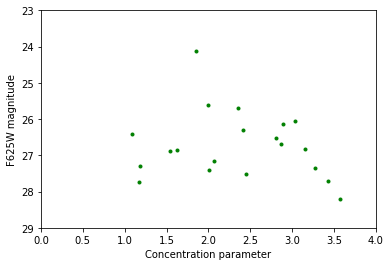

In [13]:
# Plots the concentration parameter vs magnitude
plt.plot(concentration, info[:,15], 'g.')
plt.xlabel('Concentration parameter')
plt.ylabel('F625W magnitude')
plt.xlim(0,4)
plt.ylim(29,23)

In [14]:
# Cut out clusters (identified as objects with concentration parameter < 2.3, from Chandar et. al. 2010)
new_info = np.zeros(info.shape)
for i in range(28):
    if (concentration[i] < 2.3): # & (concentration[i] >= 0):
        new_info[i] = info[i]
new_info = new_info[~np.all(new_info == 0, axis=1)]

In [15]:
np.savetxt("Region_files/sn2014ck_NoClustersROI.reg", new_info[:,2:4], '%5.2f')

In [16]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2014ck_NoClustersROI_133pc.reg", "r+")
text = asci.readlines()
region = np.zeros([15,2])

for i in range(8):
    region[i][0] = mysplit(text[i])[0]
    region[i][1] = mysplit(text[i])[1]
region = region[~np.all(region == 0, axis=1)]

new_info1 = np.copy(new_info) # Will hold stars within 200 parsecs
new_info2 = np.zeros([region.shape[0], new_info.shape[1]]) # Will hold stars within 133 parsecs
new_info3 = np.zeros([region.shape[0], new_info.shape[1]]) # Will hold stars within 67 parsecs

j = 0 # Iteration variable for region array
for i in range(new_info.shape[0]): # Cycles through each star predicted above
    if (region[j][0] == new_info[i][2])&(region[j][1] == new_info[i][3]):
        new_info2[j] = new_info[i]
        j = j + 1
        if j == region.shape[0]: break

asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2014ck_NoClustersROI_67pc.reg", "r+")
text = asci.readlines()
region = np.zeros([9,2])

for i in range(1):
    region[i][0] = mysplit(text[i])[0]
    region[i][1] = mysplit(text[i])[1]
region = region[~np.all(region == 0, axis=1)]


j = 0 # Iteration variable for region array
for i in range(new_info1.shape[0]): # Cycles through each star predicted above
    if (region[j][0] == new_info1[i][2])&(region[j][1] == new_info1[i][3]):
        new_info3[j] = new_info1[i]
        j = j + 1
        if j == region.shape[0]: break
                
                
for i in range(new_info1.shape[0]):
    for j in range(new_info2.shape[0]):
        if np.array_equal(new_info1[i],new_info2[j]):
            new_info1[i] = np.zeros(new_info1[i].size)
for i in range(new_info2.shape[0]):
    for j in range(new_info3.shape[0]):
        if np.array_equal(new_info2[i],new_info3[j]):
            new_info2[i] = np.zeros(new_info2[i].size)
            
new_info1 = new_info1[~np.all(new_info1 == 0, axis=1)]
new_info2 = new_info2[~np.all(new_info2 == 0, axis=1)]
new_info3 = new_info3[~np.all(new_info3 == 0, axis=1)]

In [17]:
# Reddening, metallicity, and distance errors
dist_lower = 5 * (np.log10(24.32e6 - 1.77e6) - 1)
dist_upper = 5 * (np.log10(24.32e6 + 1.77e6) - 1)
red_lower = 0
red_upper = 0
metal_lower = -0.50
metal_upper = -0.50

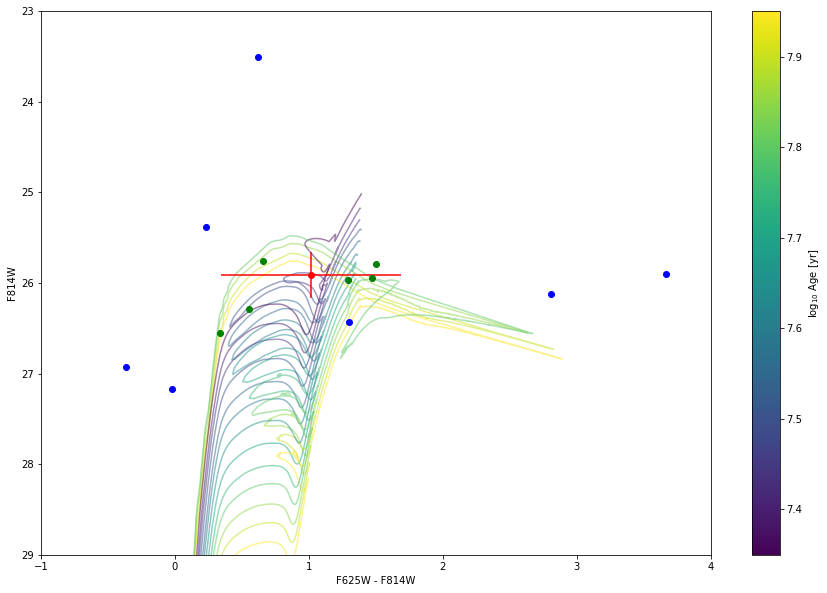

In [18]:
# fix metallicity, vary age
df = isochrones[-0.50]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}


ages = ages[(ages > 7.3) & (ages < 8)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Three adjustments: 1. Distance: added to mag 2. MW Extinction: added to both. 3. Galactic extinction
    dist_adjust = 5 * (np.log10(24.4e6) - 1)
    F625W_ext = 1.018 # extinction in F625W in UGC 12182 from NED
    F814W_ext = 0.700 # extinction in F814W in UGC 12182 from NED
    Gal_ext = 0
    mag = df[idx].WFC3_UVIS_F814W + dist_adjust + F814W_ext + 1.436*Gal_ext
    mag_lower = df[idx].WFC3_UVIS_F814W + dist_lower + F814W_ext + 1.436*red_lower
    mag_upper = df[idx].WFC3_UVIS_F814W + dist_upper + F814W_ext + 1.436*red_upper
    color = df[idx].WFC3_UVIS_F625W - df[idx].WFC3_UVIS_F814W + F625W_ext - F814W_ext + (2.259 - 1.436)*Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    #plt.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
    
# Plots stars
line1 = plt.errorbar(new_info3[:,15] - new_info3[:,28], new_info3[:,28], fmt='ro', 
                     xerr=np.sqrt(new_info3[:,17]**2 + new_info3[:,30]**2), yerr=new_info3[:,30])
#line2 = plt.errorbar(new_info2[:,15] - new_info2[:,28], new_info2[:,28], fmt='go', 
#                     xerr=np.sqrt(new_info2[:,17]**2 + new_info2[:,30]**2), yerr=new_info2[:,30])
line2 = plt.plot(new_info2[:,15] - new_info2[:,28], new_info2[:,28], 'go')
#line3 = plt.errorbar(new_info[:,15] - new_info[:,28], new_info[:,28], fmt='bo', 
#                     xerr=np.sqrt(new_info[:,17]**2 + new_info[:,30]**2), yerr=new_info[:,30])
line3 = plt.plot(new_info1[:,15] - new_info1[:,28], new_info1[:,28], 'bo')

plt.xlabel("F625W - F814W")
plt.ylabel("F814W")
plt.ylim(29,23)
plt.xlim(-1, 4)
cb = plt.colorbar(sm)
cb.set_label('$\log_{10}$ Age [yr]')

## Crappy Chi Squared Test

There are  2.0 stars above signal-to-noise of 10, and  12.0 stars below.


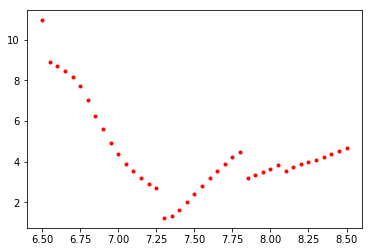

In [32]:
# Reruns through the isochrones the user specifies to get mags, colors, etc.
df = isochrones[-0.75]
Gal_ext = 0 # 0 or 0.05

ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()
ages = ages[(ages >= 6.5) & (ages <= 8.5)]

for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    mag_625 = df[idx].WFC3_UVIS_F625W + dist_adjust + F625W_ext + 2.259*Gal_ext
    mag_814 = df[idx].WFC3_UVIS_F814W + dist_adjust + F814W_ext + 1.436*Gal_ext
    age_cmd[age] = (mag_625, mag_814)
n_ages = i + 1


SN_pos = np.array([3051.4905, 2310.9626])

CChi = np.zeros([2,n_ages]) # This is the array which measure crappy chi-squared across all filters
k = 0
n10SN = 0
nlow = 0
for age, (mag_625, mag_814) in age_cmd.items():
    phys_dist_temp = 0 # This will hold the total physical distance weights to be averaged and divided out to normalize
    temp = 0 # This will hold the distance for each data point to the line
    
    # Sets the radial dispersion for the region
    sigma = 5 * (.92 * 10**age * 3.15e7 * 206265)/(24.32e6 * 3.086e13 * .05) # Replace 10**age w/ 10000000
    flat = (100 * 206265)/(24.32e6 * .05) # 100 parsecs in pixels
    flat_int = int(np.round(flat*5))
    for j in range(new_info.shape[0]):
        # Removes "stars" with mag > 90 in any band
        if (new_info[j,15] > 90) or (new_info[j,28] > 90):
            continue
        if new_info[j,5] >= 10:
            n10SN += 1
        else: nlow += 1
        
        # Uses physical distance between star and SN position to weight each star
        phys_dist = np.sqrt((SN_pos[0] - new_info[j,2])**2 + (SN_pos[1] - new_info[j,3])**2)
        weight_func = np.convolve(1/(np.sqrt(2 * np.pi) * sigma) * np.exp(- np.linspace(-200,200,2000)**2/(2 * sigma**2)),
               np.append(np.zeros(int(np.ceil((2000-flat_int)/2))),np.append(np.ones(flat_int),np.zeros(int(np.floor((2000-flat_int)/2))))))
        phys_dist_weight = weight_func[1999 + int(phys_dist*5)]
        phys_dist_temp += phys_dist_weight # Will be used to compute average of the weights
        
        # Adds the difference in mags for each data point in quadrature.
        #temp += phys_dist_weight * np.amin((new_info[j,15] - mag_435)**2/mag_435 + (new_info[j,28] - mag_555)**2/mag_555
        #                + (new_info[j,41] - mag_625)**2/mag_625 + (new_info[j,54] - mag_814)**2/mag_814)
        temp += (phys_dist_weight * np.amin(np.sqrt((new_info[j,15] - mag_625)**2
          + (new_info[j,28] - mag_814)**2)))**2
    
    # There are eleven stars removed not counted, as they have >90 mag in some filter
    phys_dist_temp /= (new_info.shape[0] - 1)
    CChi[0,k] = age
    CChi[1,k] = np.sqrt(temp)/phys_dist_temp
    k = k + 1
    
# Ensures that the crappy chi-squared arrays are ordered by age for convenience.
CChi = CChi.T[CChi.T[:,0].argsort()]
plt.plot(CChi.T[0], CChi.T[1], 'r.')
print("There are ", n10SN/n_ages, "stars above signal-to-noise of 10, and ", nlow/n_ages, "stars below.")

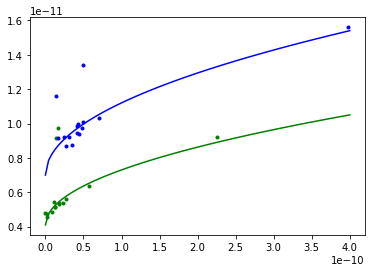

In [22]:
# Testing to find relationship between flux and flux error
x_array=np.linspace(0, 4e-10, num=100)

plt.plot(new_info[:,13], new_info[:,14], 'g.')
plt.plot(x_array, 4.1e-12 + 3.2e-7*np.sqrt(x_array), 'g-')
plt.plot(new_info[:,26], new_info[:,27], 'b.')
plt.plot(x_array, 7e-12 + 4.2e-7*np.sqrt(x_array), 'b-')

In [23]:
# Set up the fitting functions as skew normal distributions
from scipy.optimize import curve_fit
from scipy.stats import skewnorm
import scipy.integrate as integrate

# This is the function which will be fed to the fitting algorithm.
def skew(x, norm, a, loc, scale):
    return norm * skewnorm.pdf(x, a, loc=loc, scale=scale)

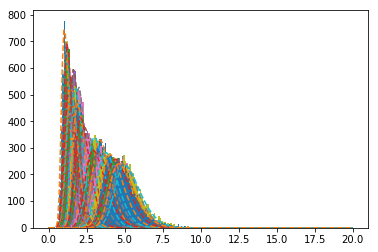

In [24]:
# This cell and the one below are for standard metallicity and no host reddening
x = np.linspace(0,20,200)
probs0 = []
for i, age in enumerate(ages):
    filename="MC_14ck_MagFit_1498504485.0/CChi_false_{Age}.npy".format(Age=np.round(age,decimals=2))
    CChi_false = np.load(filename)
    CChi_false[1,:] = CChi_false[1,:]
    halt = False
    for j in range(5000):
        if np.isinf(CChi_false[1,j]):
            CChi_false[1,j] = 999999999999
            halt = True
            continue
    if halt == True:
        probs0.append(0)
        continue
    y = plt.hist(CChi_false[1,:], bins=np.linspace(0,20,201))[0]
    popt, pcov = curve_fit(skew, x, y, p0=(2000, 3, 2, 2))
    plt.plot(x, skew(x, *popt), '--')
    norm = integrate.quad(skew, 0, 20, args=(popt[0], popt[1], popt[2], popt[3]))[0]
    probs0.append(skew(CChi[i,1], *popt)/norm)

7.3 9.15711882862


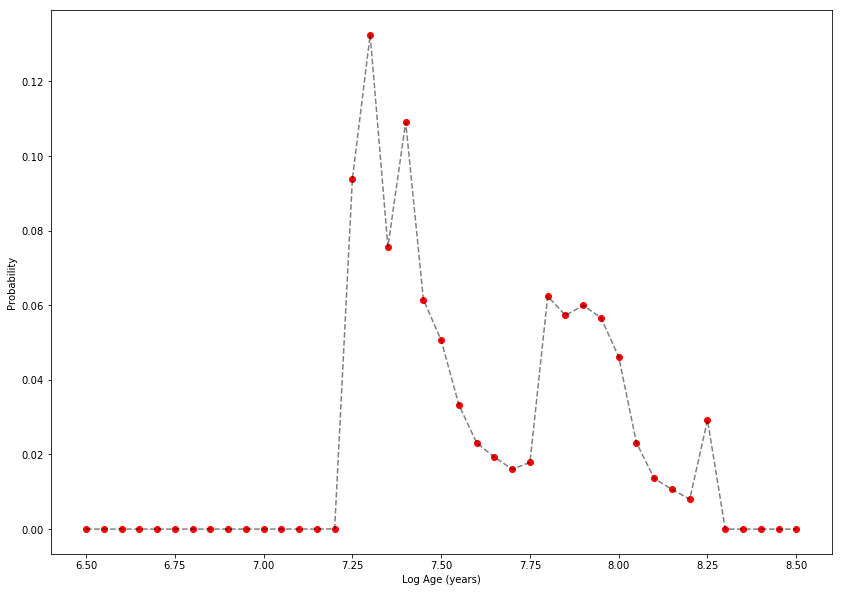

In [25]:
norm0 = np.sum(probs0)
plt.figure(figsize=(14,10));
plt.plot(CChi[:,0], probs0/norm0, 'ro')
plt.plot(CChi[:,0], probs0/norm0, 'k--', alpha=.5)
plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
print(CChi[:,0][np.argmax(probs0)], norm0)

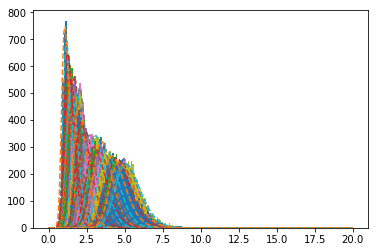

In [27]:
# This cell and the one below are for a fit with standard metallicity, maximum host reddening
x = np.linspace(0,20,200)
probs10 = []
for i, age in enumerate(ages):
    filename="MC_14ck_MagFit_1498509026.0/CChi_false_{Age}.npy".format(Age=np.round(age,decimals=2))
    CChi_false = np.load(filename)
    CChi_false[1,:] = CChi_false[1,:]
    halt = False
    for j in range(5000):
        if np.isinf(CChi_false[1,j]):
            CChi_false[1,j] = 999999999999
            halt = True
            continue
    if halt == True:
        probs10.append(0)
        continue
    y = plt.hist(CChi_false[1,:], bins=np.linspace(0,20,201))[0]
    popt, pcov = curve_fit(skew, x, y, p0=(2000, 3, 2, 2))
    plt.plot(x, skew(x, *popt), '--')
    norm = integrate.quad(skew, 0, 20, args=(popt[0], popt[1], popt[2], popt[3]))[0]
    probs10.append(skew(CChi[i,1], *popt)/norm)

7.25 9.41666448559


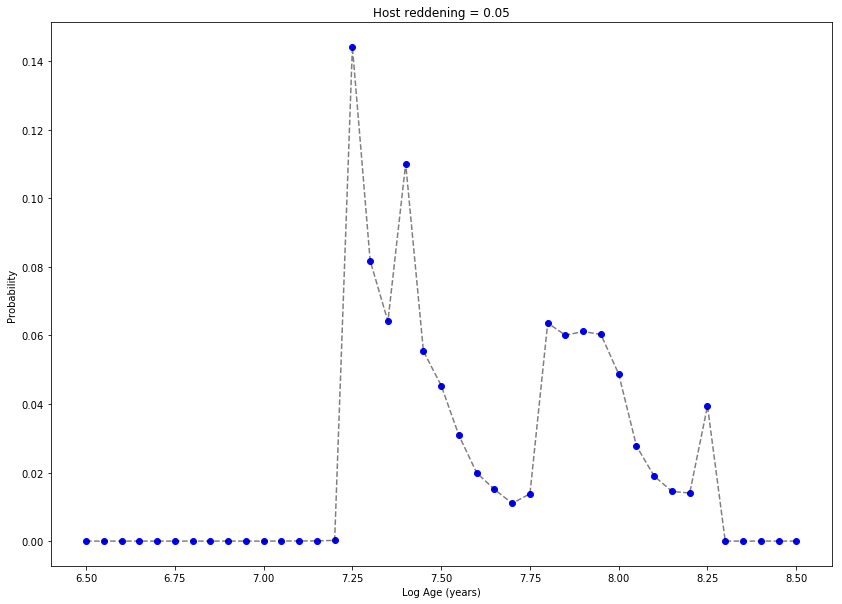

In [28]:
norm10 = np.sum(probs10)
plt.figure(figsize=(14,10));
plt.plot(CChi[:,0], probs10/norm10, 'bo')
plt.plot(CChi[:,0], probs10/norm10, 'k--', alpha=.5)
plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
plt.title("Host reddening = 0.05")
print(CChi[:,0][np.argmax(probs10)], norm10)

### Varying Metallicity

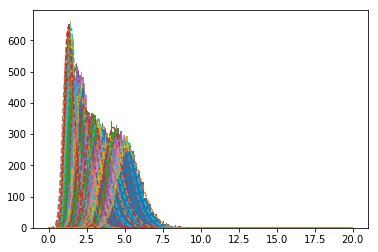

In [30]:
# This cell and the one below are for high metallicity and no host reddening
x = np.linspace(0,20,200)
probs1 = []
for i, age in enumerate(ages):
    filename="MC_14ck_MagFit_[FeH]=-.25/CChi_false_{Age}.npy".format(Age=np.round(age,decimals=2))
    CChi_false = np.load(filename)
    CChi_false[1,:] = CChi_false[1,:]
    halt = False
    for j in range(5000):
        if np.isinf(CChi_false[1,j]):
            CChi_false[1,j] = 999999999999
            halt = True
            continue
    if halt == True:
        probs1.append(0)
        continue
    y = plt.hist(CChi_false[1,:], bins=np.linspace(0,20,201))[0]
    popt, pcov = curve_fit(skew, x, y, p0=(2000, 3, 2, 2))
    plt.plot(x, skew(x, *popt), '--')
    norm = integrate.quad(skew, 0, 20, args=(popt[0], popt[1], popt[2], popt[3]))[0]
    probs1.append(skew(CChi[i,1], *popt)/norm)

7.4


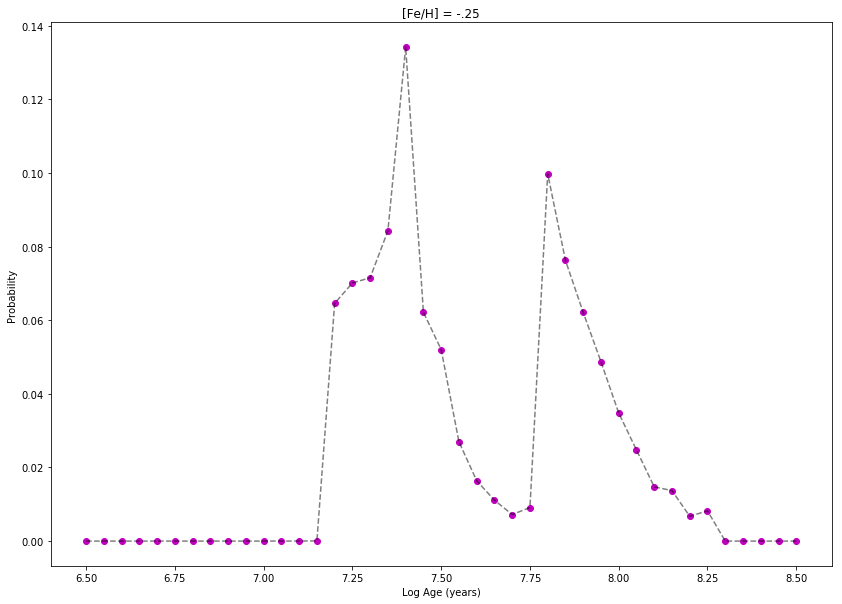

In [31]:
norm1 = np.sum(probs1)
plt.figure(figsize=(14,10));
plt.plot(CChi[:,0], probs1/norm1, 'mo')
plt.plot(CChi[:,0], probs1/norm1, 'k--', alpha=.5)
plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
plt.title("[Fe/H] = -.25")
print(CChi[:,0][np.argmax(probs1)])

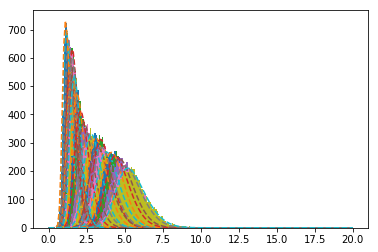

In [33]:
# This cell and the one below are for low metallicity and no host reddening
x = np.linspace(0,20,200)
probs2 = []
for i, age in enumerate(ages):
    filename="MC_14ck_MagFit_[FeH]=-.75/CChi_false_{Age}.npy".format(Age=np.round(age,decimals=2))
    CChi_false = np.load(filename)
    CChi_false[1,:] = CChi_false[1,:]
    halt = False
    for j in range(5000):
        if np.isinf(CChi_false[1,j]):
            CChi_false[1,j] = 999999999999
            halt = True
            continue
    if halt == True:
        probs2.append(0)
        continue
    y = plt.hist(CChi_false[1,:], bins=np.linspace(0,20,201))[0]
    popt, pcov = curve_fit(skew, x, y, p0=(2000, 3, 2, 2))
    plt.plot(x, skew(x, *popt), '--')
    norm = integrate.quad(skew, 0, 20, args=(popt[0], popt[1], popt[2], popt[3]))[0]
    probs2.append(skew(CChi[i,1], *popt)/norm)

7.4


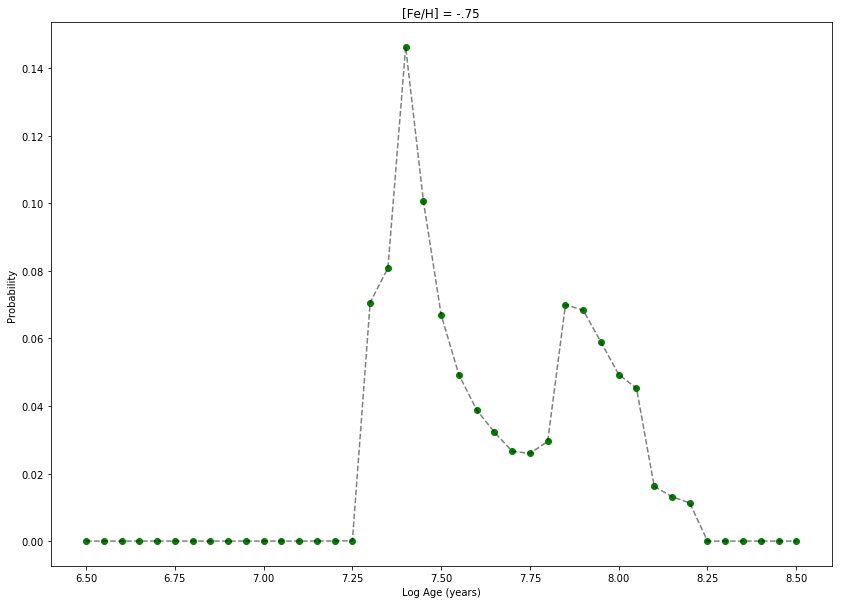

In [34]:
norm2 = np.sum(probs2)
plt.figure(figsize=(14,10));
plt.plot(CChi[:,0], probs2/norm2, 'go')
plt.plot(CChi[:,0], probs2/norm2, 'k--', alpha=.5)
plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
plt.title("[Fe/H] = -.75")
print(CChi[:,0][np.argmax(probs2)])

9.15711882862 7.23932440177 8.0878330312


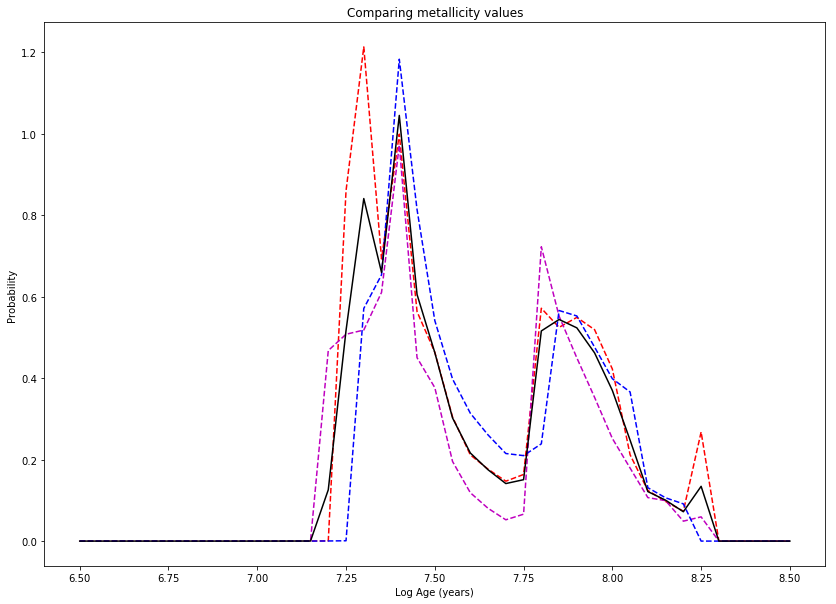

7.4


In [37]:
plt.figure(figsize=(14,10));
plt.plot(CChi[:,0], probs0, 'r--', CChi[:,0], probs1, 'm--', CChi[:,0], probs2, 'b--')
plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
plt.title("Comparing metallicity values")
print(norm0, norm1, norm2)

# Applying a gaussian prior
mu = -.51
sigma = .26
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))
probs_tot = (np.array(probs0) * norm(-.50) + np.array(probs1) * norm(-.25) + np.array(probs2) * norm(-.75))/(
    norm(-.50) + norm(-.25) + norm(-.75))
plt.plot(CChi[:,0], probs_tot, 'k')
plt.show()

np.save("Region_files/14ck_Mag_probs", probs_tot)

print(CChi[:,0][np.argmax(probs_tot)])

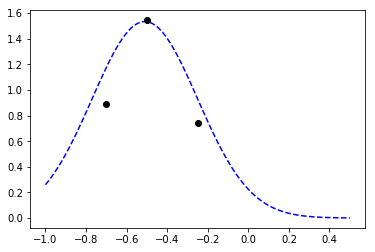

In [36]:
# Compare posterior in metallicity to prior
x_array = np.linspace(-1,.5,100)
plt.plot(x_array, norm(x_array), 'b--', label='Prior')

plt.plot([-.50,-.25,-.70], [.11*norm0*norm(-.50), .11*norm1*norm(-.25), .11*norm2*norm(-.75)], 'ko')

## Making Subplots

In [39]:
df = isochrones[-0.50]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}

ages = ages[(ages > 7.39) & (ages < 7.41)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Two adjustments: 1. Distance: added to mag 2. Extinction: added to both.
    F625W_ext = 1.018 # extinction in F625W in UGC 12182 from NED
    F814W_ext = 0.700 # extinction in F814W in UGC 12182 from NED
    Gal_ext = 0
    mag = df[idx].WFC3_UVIS_F814W + dist_adjust + F814W_ext + 1.436*Gal_ext
    mag_lower = df[idx].WFC3_UVIS_F814W + dist_lower + F814W_ext + 1.526*red_lower
    mag_upper = df[idx].WFC3_UVIS_F814W + dist_upper + F814W_ext + 1.526*red_upper
    color = df[idx].WFC3_UVIS_F625W - df[idx].WFC3_UVIS_F814W + F625W_ext - F814W_ext + (2.219 - 1.526)*Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')

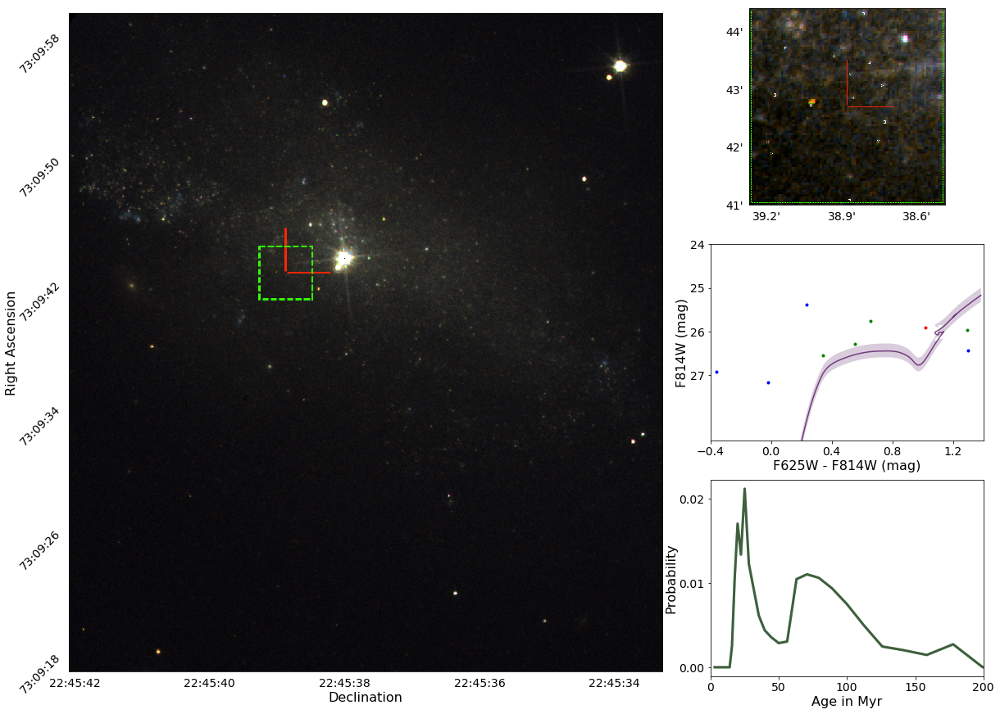

In [69]:
from matplotlib import gridspec
import matplotlib.image as im

# Setup figure and grid
fig = plt.figure(figsize=(20,15))
gs = gridspec.GridSpec(3, 3)
gs.update(wspace=0.175, hspace=0.2)

axis_font = {'size':'16'} # Sets font size
tick_font = {'size':'14'}

### Figure 0: Whole galaxy ###
ax0 = plt.subplot(gs[:, :-1])
image=im.imread(Iax_dir + '/Iax_Pictures/2014ck_4.5kpc.5kpc.png')
ax0.imshow(image)
# Setting the ticks
x_tick = 790/(42.083 - 33.282)
x_start = x_tick*.083
ax0.set_xticks([x_start, x_start + 2*x_tick, x_start + 4*x_tick, x_start + 6*x_tick, x_start + 8*x_tick])
ax0.set_xticklabels(['22:45:42', '22:45:40', '22:45:38', '22:45:36', '22:45:34'], **tick_font)
y_tick = 877/(59.38 - 16.98)
y_start = y_tick*1.38
ax0.set_yticks([y_start, y_start + 8*y_tick, y_start + 16*y_tick, y_start + 24*y_tick,
                y_start + 32*y_tick, y_start + 40*y_tick])
ax0.set_yticklabels(['73:09:58', '73:09:50', '73:09:42', '73:09:34', '73:09:26', '73:09:18'], rotation=45, **tick_font)
# Setting labels
ax0.set_xlabel("Declination", **axis_font)
ax0.set_ylabel("Right Ascension", **axis_font)
ax0.xaxis.set_label_coords(.5, -.03)
ax0.xaxis.set_ticks_position('none')
ax0.yaxis.set_label_coords(-.085, .5)
ax0.yaxis.set_ticks_position('none')

### Figure 1: Zoom in on ROI ###
ax1 = plt.subplot(gs[0,-1])
image=im.imread(Iax_dir + '/Iax_Pictures/2014ck_400pc.400pc.png')
ax1.imshow(image)
# Setting the ticks
x_tick = 856/(39.271 - 38.489)
x_start = x_tick*.071
ax1.set_xticks([x_start, x_start + .3*x_tick, x_start + .6*x_tick])
ax1.set_xticklabels(["39.2'", "38.9'", "38.6'"], **tick_font) # Append 23:34 to front for full coords
y_tick = 859/(44.39 - 41)
y_start = y_tick*.39
ax1.set_yticks([y_start, y_start + y_tick, y_start + 2*y_tick, y_start + 3*y_tick])
ax1.set_yticklabels(["44'", "43'", "42'", "41'"], **tick_font) # Append 18:13 for full coords
# Setting labels
ax1.xaxis.set_label_coords(.5, -.18)
ax1.xaxis.set_ticks_position('none')
ax1.yaxis.set_label_coords(-.45, .5)
ax1.yaxis.set_ticks_position('none')

### Figure 2: Color-magnitude diagram ###
ax2 = plt.subplot(gs[1,-1])
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    ax2.plot(color, mag, alpha=0.7, color=sm.to_rgba(age), zorder=0)
    ax2.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
# Plots stars
line1 = ax2.plot(new_info1[:,15] - new_info1[:,28], new_info1[:,28], 'b.')
line2 = ax2.plot(new_info2[:,15] - new_info2[:,28], new_info2[:,28], 'g.')
line3 = ax2.plot(new_info3[:,15] - new_info3[:,28], new_info3[:,28], 'r.')
# Setting labels and axis range
ax2.set_xlabel("F625W - F814W (mag)", **axis_font)
ax2.set_ylabel("F814W (mag)", **axis_font)
ax2.xaxis.set_label_coords(.5, -.1)
ax2.yaxis.set_label_coords(-.08, .5)
ax2.set_ylim(28.5,25.5)
ax2.set_xlim(-.4, 1.4)
ax2.tick_params(axis='both', which='major', labelsize=14)
ax2.set_yticks(np.arange(24, 28))
ax2.set_xticks(np.arange(-.40,1.4,.4))

### Figure 3: Probability distribution function ###
ax3 = plt.subplot(gs[2,-1])
norm_linear = np.trapz(probs_tot, 10**(CChi[:, 0])/1e6)
ax3.plot(10**(CChi[:, 0])/1e6, probs_tot/norm_linear, 'g-', alpha=.5, linewidth=3)
ax3.plot(10**(CChi[:, 0])/1e6, probs_tot/norm_linear, 'k-', alpha=.5, linewidth=3)
# Setting labels and axis range
ax3.set_xlabel("Age in Myr", **axis_font)
ax3.set_ylabel("Probability", **axis_font)
ax3.xaxis.set_label_coords(.5, -.1)
ax3.yaxis.set_label_coords(-.12, .5)
ax3.set_xlim(0,200)
ax3.tick_params(axis='both', which='major', labelsize=14)
ax3.set_yticks(np.arange(0, .03, .01));

plt.savefig('2014ck_Fig.pdf', dpi=1000)

## Loading in photometry from manual DOLPHOT run

In [2]:
Iax_dir = "/Users/tktakaro/Documents/Type-Iax-HST" #"D:/Research/Type-Iax-HST"
catalog_new = np.loadtxt(Iax_dir+"/new_files/sn2014ck/sn2014ck") #sn2014ck.out2")

In [3]:
pos_predict_new = np.zeros((catalog_new.shape[0],2))
info_predict_new = np.zeros(np.shape(catalog_new))

j = 0 # Iteration variable for positions array
for i in range(catalog_new.shape[0]): # Cycles through each object in catalog
    # Checks to make sure point is "good"
    # Good defined by: 1. S/N > 3.5     2. Sharpness < .3     3. Roundness < 1     4. Crowding < .1 
    if ((catalog_new[i][5] >= 3.5)&(abs(catalog_new[i][6]) < .3)&(abs(catalog_new[i][7]) < 1)
        &(catalog_new[i][9] < .1)):
        pos_predict_new[j][0] = catalog_new[i][2] # Assigns X position
        pos_predict_new[j][1] = catalog_new[i][3] # Assigns Y position
        info_predict_new[j] = catalog_new[i]
        j = j + 1
                
# Trims all zeros from end of positions array, left from "bad" objects
pos_predict_new = pos_predict_new[~np.all(pos_predict_new == 0, axis=1)]
info_predict_new = info_predict_new[~np.all(info_predict_new == 0, axis=1)]

# Saves high S/N object X,Y positions
np.savetxt("Region_files/sn2014ck_Prediction_new.reg", pos_predict_new, '%5.2f')

In [4]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2014ck_200pc_new.reg", "r+")

def mysplit(s, delim=None):
    return [x for x in s.split(delim) if x]

text = asci.readlines()
region = np.zeros([33,2])
for i in range(33):
    region[i][0] = mysplit(text[i], ' ')[0]
    region[i][1] = mysplit(text[i], ' ')[1]
region = region[~np.all(region == 0, axis=1)]

# Info for each star chosen as real 
info_new = np.zeros([region.shape[0],info_predict_new.shape[1]])

j = 0 # Iteration variable for region array
for i in range(info_predict_new.shape[0]): # Cycles through each star predicted above
    if (region[j][0] == pos_predict_new[i][0])&(region[j][1] == pos_predict_new[i][1]):
        info_new[j] = info_predict_new[i]
        j = j + 1
        if j == region.shape[0]: break

In [5]:
# Using IRAF to compute actual concentration index, i.e. photometry at .5 pixels to photometry at 3 pixels
ascii_1 = open(Iax_dir + "/new_files/sn2014ck/final_WFC3_F625W_crc1.mag.1")
ascii_2 = open(Iax_dir + "/new_files/sn2014ck/final_WFC3_F625W_crc1.mag.2")
text_1 = ascii_1.readlines()
text_2 = ascii_2.readlines()

concentration = np.zeros(33)
for i in range(33):
    if mysplit(text_1[5*i + 79])[4] == 'INDEF': # Removes objects with no defined magnitude at .5 pixels
        concentration[i] = 99
    elif mysplit(text_2[5*i + 79])[4] == 'INDEF': # Removes objects with no defined magnitude at 3 pixels
        concentration[i] = -99
    else: concentration[i] = float(mysplit(text_1[5*i + 79])[4]) - float(mysplit(text_2[5*i + 79])[4])
ascii_1.close()
ascii_2.close()

(-3, -10)

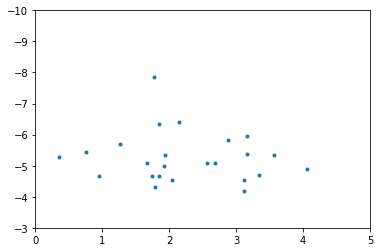

In [8]:
plt.plot(concentration, info_new[:,15] - 5*(np.log10(24.32e6) - 1), '.')
plt.xlim(0,5)
plt.ylim(-3,-10)

In [11]:
# Cut out clusters (identified as objects with concentration parameter < 2.3, from Chandar et. al. 2010)
info = np.zeros(info_new.shape)
for i in range(33):
    if not ((concentration[i] > 1.5) and (info_new[i,15] - 5*(np.log10(24.32e6) - 1) < -6)): #(concentration[i] < 2.3):
        info[i] = info_new[i]
info = info[~np.all(info == 0, axis=1)]

np.savetxt("Region_files/sn2014ck_NoClustersROI_new.reg", info[:,2:4], '%5.2f')

In [12]:
print(info.shape)

(30, 141)


In [13]:
mist_dir = "/Users/tktakaro/Documents/Type-Iax-HST/MIST/WFC3-UVIS"

kwargs = {"names": ["EEP", "log10_isochrone_age_yr", "initial_mass", "star_mass", "log_Teff", "log_g", "log_L",
                        "[Fe/H]_init", "[Fe/H]", "WFC3_UVIS_F200LP", "WFC3_UVIS_F218W", "WFC3_UVIS_F225W",
                        "WFC3_UVIS_F275W", "WFC3_UVIS_F280N", "WFC3_UVIS_F300X", "WFC3_UVIS_F336W",
                        "WFC3_UVIS_F343N", "WFC3_UVIS_F350LP", "WFC3_UVIS_F373N", "WFC3_UVIS_F390M",
                        "WFC3_UVIS_F390W", "WFC3_UVIS_F395N", "WFC3_UVIS_F410M", "WFC3_UVIS_F438W",
                        "WFC3_UVIS_F467M", "WFC3_UVIS_F469N", "WFC3_UVIS_F475W", "WFC3_UVIS_F475X",
                        "WFC3_UVIS_F487N", "WFC3_UVIS_F502N", "WFC3_UVIS_F547M", "WFC3_UVIS_F555W",
                        "WFC3_UVIS_F600LP", "WFC3_UVIS_F606W", "WFC3_UVIS_F621M", "WFC3_UVIS_F625W",
                        "WFC3_UVIS_F631N", "WFC3_UVIS_F645N", "WFC3_UVIS_F656N", "WFC3_UVIS_F657N",
                        "WFC3_UVIS_F658N", "WFC3_UVIS_F665N", "WFC3_UVIS_F673N", "WFC3_UVIS_F680N",
                        "WFC3_UVIS_F689M", "WFC3_UVIS_F763M", "WFC3_UVIS_F775W", "WFC3_UVIS_F814W",
                        "WFC3_UVIS_F845M", "WFC3_UVIS_F850LP", "WFC3_UVIS_F953N", "WFC3_IR_F098M",
                        "WFC3_IR_F105W", "WFC3_IR_F110W", "WFC3_IR_F125W", "WFC3_IR_F126N", "WFC3_IR_F127M",
                        "WFC3_IR_F128N", "WFC3_IR_F130N", "WFC3_IR_F132N", "WFC3_IR_F139M", "WFC3_IR_F140W",
                        "WFC3_IR_F153M", "WFC3_IR_F160W", "WFC3_IR_F164N", "WFC3_IR_F167N", "phase"],
            "delim_whitespace": True, "comment": "#"}
isochrones = {}
for filename in glob.glob(mist_dir + "/*.iso.cmd"):
    filename = filename.replace("\\", "/")
    feh_string = filename.split("/")[-1].split("=")[1].split(".iso")[0] # Pulls metalicity information
    feh = float(feh_string) # feh is [Fe/H]
    df = pandas.read_csv(filename, **kwargs)
    df['ages'] = 10 ** df.log10_isochrone_age_yr / 1e9
    isochrones[feh] = df # Creates dictionary accessible by entering a particular metalicity

In [14]:
# Reddening, metallicity, and distance errors
dist_lower = 5 * (np.log10(24.32e6 - 1.69e6) - 1)
dist_upper = 5 * (np.log10(24.32e6 + 1.69e6) - 1)
red_lower = 0
red_upper = 0
metal_lower = -0.25
metal_upper = -0.77

[ 7.9]


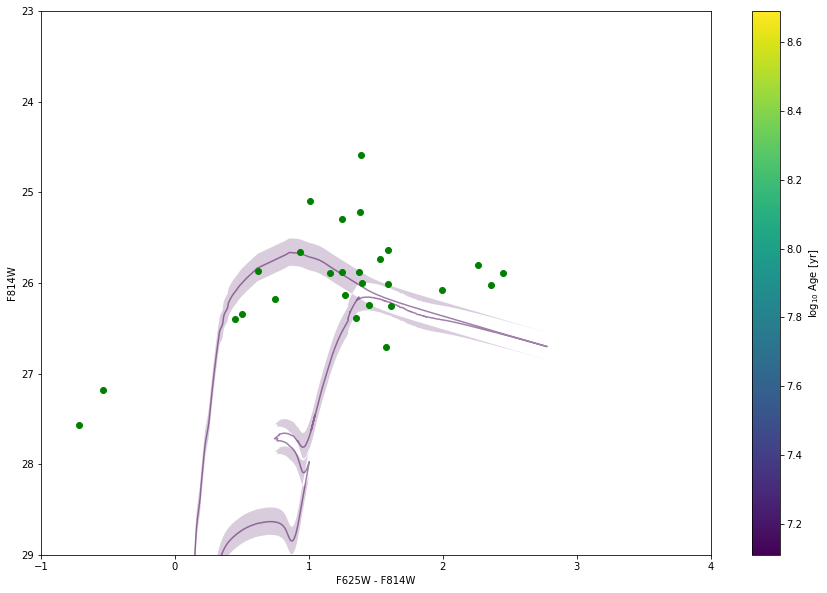

In [15]:
# fix metallicity, vary age
df = isochrones[-0.51]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}

ages = ages[(ages > 7.89) & (ages < 7.91)]
print(ages)
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Three adjustments: 1. Distance: added to mag 2. MW Extinction: added to both. 3. Galactic extinction
    dist_adjust = 5 * (np.log10(24.32e6) - 1)
    F625W_ext = 1.018 # extinction in F625W in UGC 12182 from NED
    F814W_ext = 0.700 # extinction in F814W in UGC 12182 from NED
    Gal_ext = 0
    mag = df[idx].WFC3_UVIS_F814W + dist_adjust + F814W_ext + 1.436*Gal_ext
    mag_lower = df[idx].WFC3_UVIS_F814W + dist_lower + F814W_ext + 1.436*Gal_ext
    mag_upper = df[idx].WFC3_UVIS_F814W + dist_upper + F814W_ext + 1.436*Gal_ext
    color = df[idx].WFC3_UVIS_F625W - df[idx].WFC3_UVIS_F814W + F625W_ext - F814W_ext + (2.259 - 1.436)*Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    plt.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
    
# Plots stars
#line1 = plt.errorbar(F435W_F1 - F555W_F1, F555W_F1, fmt='ro', xerr=xerr_F1, yerr=yerr_F1)
line2 = plt.plot(info[:,15] - info[:,28], info[:,28], 'go')

plt.xlabel("F625W - F814W")
plt.ylabel("F814W")
plt.ylim(29,23)
plt.xlim(-1, 4)
cb = plt.colorbar(sm)
cb.set_label('$\log_{10}$ Age [yr]')

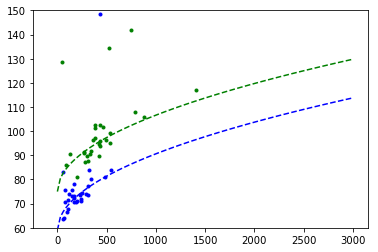

In [16]:
# Testing to find relationship between flux and flux error
x_array=np.linspace(0, 3000, num=100)

plt.plot(info[:,11], info[:,17]/1.0857 * info[:,11], 'b.')
plt.plot(x_array, 59 + np.sqrt(x_array), 'b--')
plt.plot(info[:,24], info[:,30]/1.0857 * info[:,24], 'g.')
plt.plot(x_array, 75 + np.sqrt(x_array), 'g--')
plt.ylim(60,150)
plt.show()

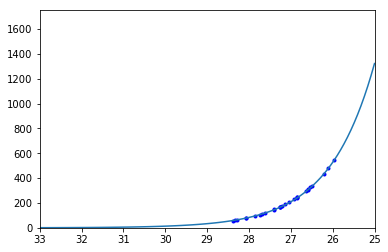

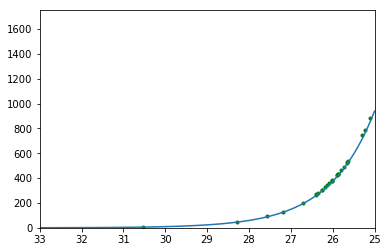

In [17]:
x_array = np.linspace(25,33,100)
plt.ylim(0,1750)
plt.xlim(33,25)
plt.plot(info[:,15], info[:,11], 'b.')
plt.plot(x_array, 1.8*510 * 10**((25.396 - x_array)/2.5))
plt.show()

plt.ylim(0,1750)
plt.xlim(33,25)
plt.plot(info[:,28], info[:,24], 'g.')
plt.plot(x_array, 1.8*680 * 10**((24.712 - x_array)/2.5))
plt.show()

In [19]:
metallicity = np.array([-1.03, -.77, -.51, -.25, .01])
reddening = np.array([0, .025, .05])
SN_pos = np.array([3056.244, 2311.9653])
CChi = np.zeros([metallicity.size, reddening.size, 41, 4, 1]) #41 = n_ages
CChi_temp = np.zeros([2,1])


for k, met in enumerate(metallicity):
    df = isochrones[met] # Sets metallicity. Eventually this will be varied over.
    ages = np.array(list(set(df.log10_isochrone_age_yr)))
    ages.sort()
    for j, red in enumerate(reddening):
        for i, age in enumerate(ages):
            CChi[k, j, i, 1, :] = met
            CChi[k, j, i, 2, :] = red
            CChi[k, j, i, 3, :] = age
            
            idx = df.log10_isochrone_age_yr == age
            mag_625 = df[idx].WFC3_UVIS_F625W + dist_adjust + F625W_ext + 2.259*red
            mag_814 = df[idx].WFC3_UVIS_F814W + dist_adjust + F814W_ext + 1.436*red
            
            
            phys_dist_temp = 0 # This will hold the total physical distance weights to be averaged and divided out to normalize
            temp = 0 # This will hold the distance for each data point to the line
    
            # Sets the radial dispersion for the region
            sigma = 5 * (.92 * 10**age * 3.15e7 * 206265)/(24.32e6 * 3.086e13 * .05) # Replace 10**age w/ 10000000
            flat = (100 * 206265)/(24.32e6 * .05) # 100 parsecs in pixels
            flat_int = int(np.round(flat*5))
            for l in range(info.shape[0]):
                # Removes "stars" with mag > 90 in any band
                if (info[l,15] > 90) or (info[l,28] > 90):
                    continue
        
                # Uses physical distance between star and SN position to weight each star
                phys_dist = np.sqrt((SN_pos[0] - info[l,2])**2 + (SN_pos[1] - info[l,3])**2)
                weight_func = np.convolve(1/(np.sqrt(2 * np.pi) * sigma) * np.exp(- np.linspace(-200,200,2000)**2/(2 * sigma**2)),
                   np.append(np.zeros(int(np.ceil((2000-flat_int)/2))),np.append(np.ones(flat_int),np.zeros(int(np.floor((2000-flat_int)/2))))))
                phys_dist_weight = weight_func[1999 + int(phys_dist*5)]
                phys_dist_temp += phys_dist_weight # Will be used to compute average of the weights
        
                # Adds the difference in mags for each data point in quadrature.
                temp += (phys_dist_weight * np.amin(np.sqrt((info[l,15] - mag_625)**2
                  + (info[l,28] - mag_814)**2)))**2
    
            phys_dist_temp /= (info.shape[0] - 1) # Previously none subtracted
            CChi[k,j,i,0,:] = np.sqrt(temp)/phys_dist_temp

In [20]:
# Now, replace the fitting functions (previously polynomials) with skew normal distributions
from scipy.optimize import curve_fit
from scipy.stats import skewnorm
import scipy.integrate as integrate

# This is the function which will be fed to the fitting algorithm.
def skew(x, norm, a, loc, scale):
    return norm * skewnorm.pdf(x, a, loc=loc, scale=scale)

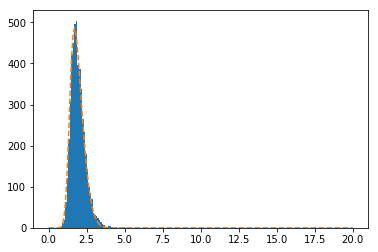

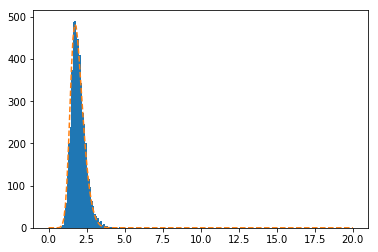

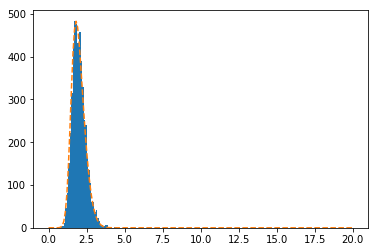

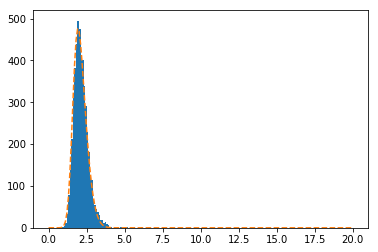

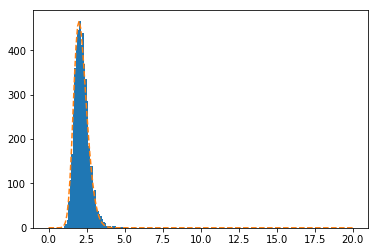

...

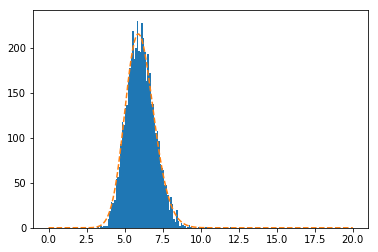

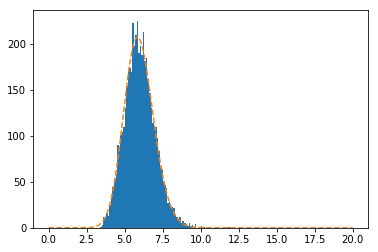

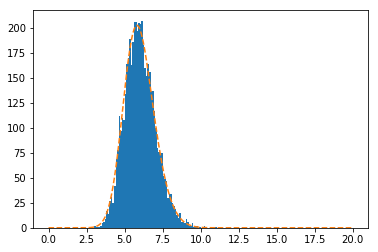

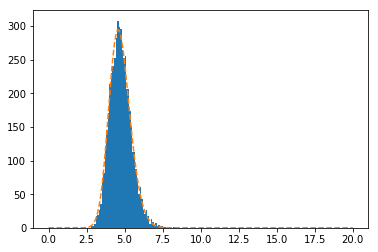

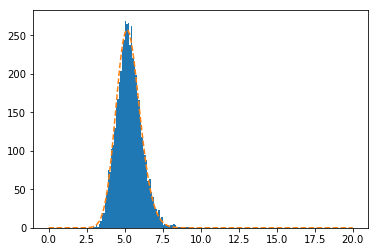

In [21]:
x = np.linspace(0,20,200)
probs = np.zeros([metallicity.size, reddening.size, 41]) #[]

CChi_false = np.load("MC_14ck_MagFit_1519320881.0/CChi_false_ages.npy")
for k, met in enumerate(metallicity):
    df = isochrones[met]
    ages = np.array(list(set(df.log10_isochrone_age_yr)))
    ages.sort()
    for j, red in enumerate(reddening):
        popt = (2000,3,2,2)
        for i, age in enumerate(ages):
            halt = False
            for l in range(5000):
                if np.isinf(CChi_false[k,j,i,0,l]) or np.isnan(CChi_false[k,j,i,0,l]):
                    CChi_false[k,j,i,0,l] = 999999999999
                    halt = True
                    probs[k,j,i] = 0
                    break
            if halt == True:
                probs[k,j,i] = 0
                continue
            y = plt.hist(30./20. * CChi_false[k,j,i,0,:], bins=np.linspace(0,20,201))[0]
            try:
                popt, pcov = curve_fit(skew, x, y, p0=(2000,3,2,2))
            except RuntimeError:
                print(met, red, age)
                popt = [.1 * p for p in popt]
                popt, pcov = curve_fit(skew, x, y, p0=popt)
            plt.plot(x, skew(x, *popt), '--')
            plt.show()
            norm = integrate.quad(skew, 0, 20, args=(popt[0], popt[1], popt[2], popt[3]))[0]
            probs[k,j,i] = skew(CChi[k,j,i,0,0], *popt)/norm

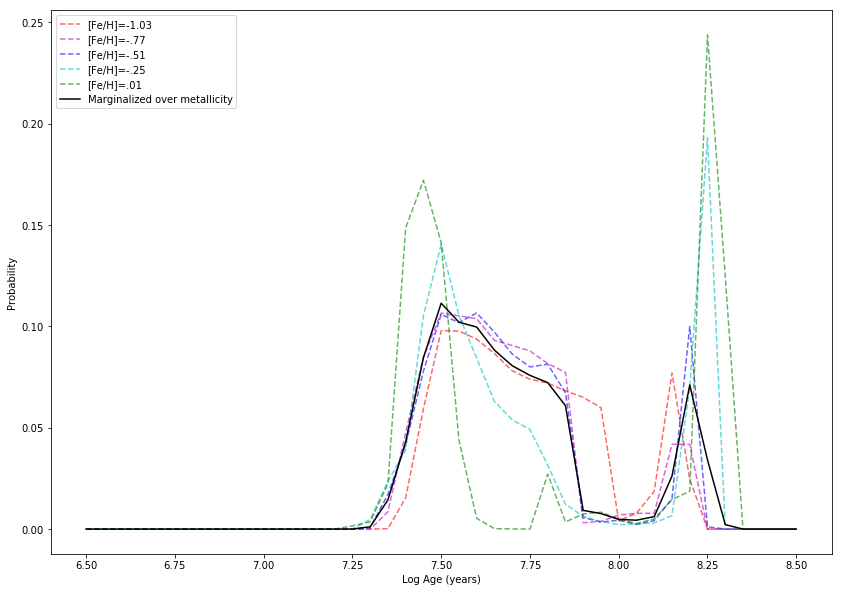

7.5


In [23]:
# Plotting all metallicities, assuming no reddening
plt.figure(figsize=(14,10));
plt.plot(CChi[0, 0, :, 3, 0], probs[0,0,:]/np.sum(probs[0,0,:]), 'r--', alpha=.6, label='[Fe/H]=-1.03')
plt.plot(CChi[1, 0, :, 3, 0], probs[1,0,:]/np.sum(probs[1,0,:]), 'm--', alpha=.6, label='[Fe/H]=-.77')
plt.plot(CChi[2, 0, :, 3, 0], probs[2,0,:]/np.sum(probs[2,0,:]), 'b--', alpha=.6, label='[Fe/H]=-.51')
plt.plot(CChi[3, 0, :, 3, 0], probs[3,0,:]/np.sum(probs[3,0,:]), 'c--', alpha=.6, label='[Fe/H]=-.25')
plt.plot(CChi[4, 0, :, 3, 0], probs[4,0,:]/np.sum(probs[4,0,:]), 'g--', alpha=.6, label='[Fe/H]=.01')

# Applying a gaussian prior
mu = -0.51
sigma = .26
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))

probs_0 = (probs[0,0,:] * norm(-1.03) + probs[1,0,:] * norm(-.77) + probs[2,0,:] * norm(-.51) + 
            probs[3,0,:] * norm(-.25) + probs[4,0,:] * norm(.01))/(
            norm(-1.03) + norm(-.77) + norm(-.51) + norm(-.25) + norm(.01))
plt.plot(CChi[0,0,:,3,0], probs_0/np.sum(probs_0), 'k', label='Marginalized over metallicity')

plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
plt.legend()
plt.show()

print(CChi[0,0,:,3,0][np.argmax(probs_0)])

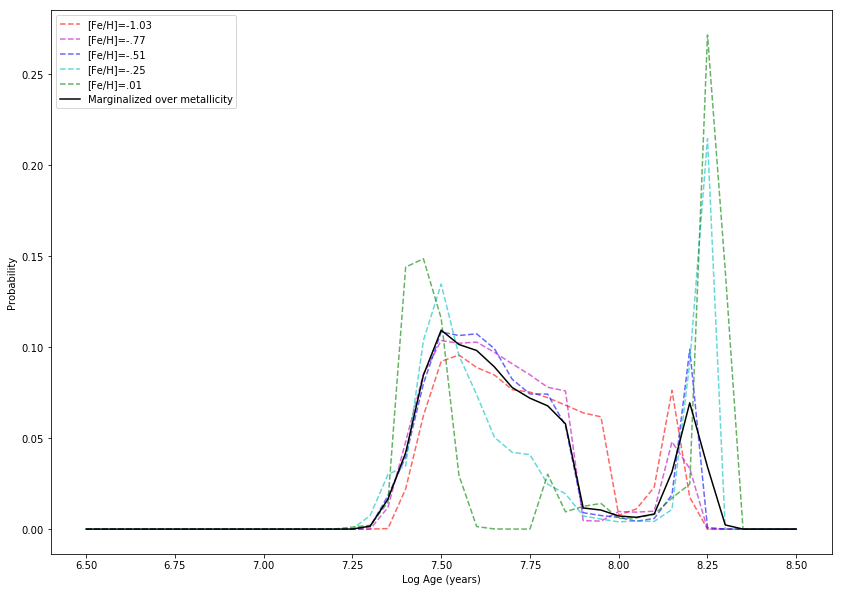

7.5


In [24]:
# Plotting all metallicities, assuming middle reddening
plt.figure(figsize=(14,10));
plt.plot(CChi[0, 1, :, 3, 0], probs[0,1,:]/np.sum(probs[0,1,:]), 'r--', alpha=.6, label='[Fe/H]=-1.03')
plt.plot(CChi[1, 1, :, 3, 0], probs[1,1,:]/np.sum(probs[1,1,:]), 'm--', alpha=.6, label='[Fe/H]=-.77')
plt.plot(CChi[2, 1, :, 3, 0], probs[2,1,:]/np.sum(probs[2,1,:]), 'b--', alpha=.6, label='[Fe/H]=-.51')
plt.plot(CChi[3, 1, :, 3, 0], probs[3,1,:]/np.sum(probs[3,1,:]), 'c--', alpha=.6, label='[Fe/H]=-.25')
plt.plot(CChi[4, 1, :, 3, 0], probs[4,1,:]/np.sum(probs[4,1,:]), 'g--', alpha=.6, label='[Fe/H]=.01')

# Applying a gaussian prior
mu = -0.51
sigma = .26
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))

probs_1 = (probs[0,1,:] * norm(-1.03) + probs[1,1,:] * norm(-.77) + probs[2,1,:] * norm(-.51) + 
            probs[3,1,:] * norm(-.25) + probs[4,1,:] * norm(.01))/(
            norm(-1.03) + norm(-.77) + norm(-.51) + norm(-.25) + norm(.01))
plt.plot(CChi[0,1,:,3,0], probs_1/np.sum(probs_1), 'k', label='Marginalized over metallicity')

plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
plt.legend()
plt.show()

print(CChi[0,1,:,3,0][np.argmax(probs_1)])

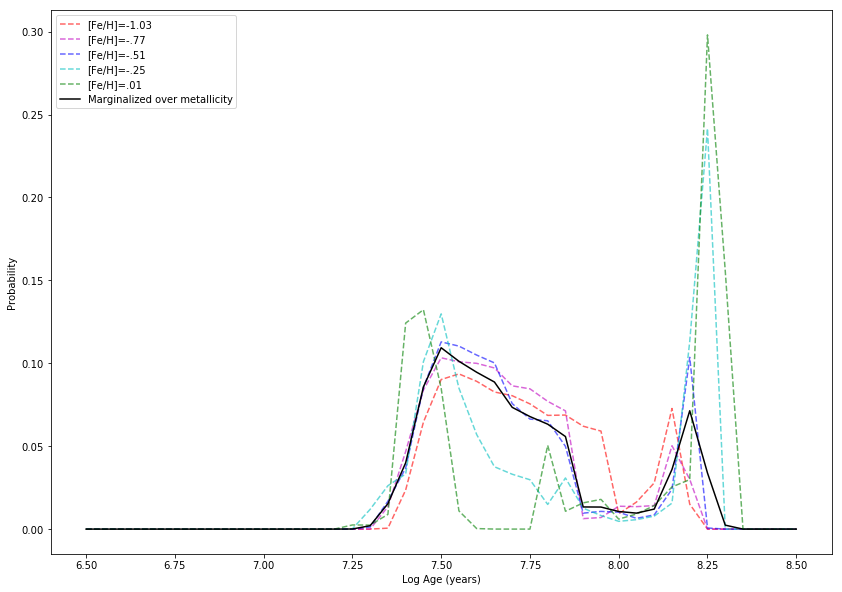

7.5


In [25]:
# Plotting all metallicities, assuming max reddening
plt.figure(figsize=(14,10));
plt.plot(CChi[0, 2, :, 3, 0], probs[0,2,:]/np.sum(probs[0,2,:]), 'r--', alpha=.6, label='[Fe/H]=-1.03')
plt.plot(CChi[1, 2, :, 3, 0], probs[1,2,:]/np.sum(probs[1,2,:]), 'm--', alpha=.6, label='[Fe/H]=-.77')
plt.plot(CChi[2, 2, :, 3, 0], probs[2,2,:]/np.sum(probs[2,2,:]), 'b--', alpha=.6, label='[Fe/H]=-.51')
plt.plot(CChi[3, 2, :, 3, 0], probs[3,2,:]/np.sum(probs[3,2,:]), 'c--', alpha=.6, label='[Fe/H]=-.25')
plt.plot(CChi[4, 2, :, 3, 0], probs[4,2,:]/np.sum(probs[4,2,:]), 'g--', alpha=.6, label='[Fe/H]=.01')

# Applying a gaussian prior
mu = -0.51
sigma = .26
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))

probs_2 = (probs[0,2,:] * norm(-1.03) + probs[1,2,:] * norm(-.77) + probs[2,2,:] * norm(-.51) + 
            probs[3,2,:] * norm(-.25) + probs[4,2,:] * norm(.01))/(
            norm(-1.03) + norm(-.77) + norm(-.51) + norm(-.25) + norm(.01))
plt.plot(CChi[0,2,:,3,0], probs_2/np.sum(probs_2), 'k', label='Marginalized over metallicity')

plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
plt.legend()
plt.show()

print(CChi[0,2,:,3,0][np.argmax(probs_2)])

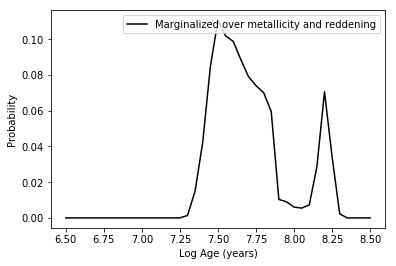

In [26]:
# Applying a gaussian prior
mu = 0
sigma = .025
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))

probs_tot = (probs_0 * norm(0) + probs_1 * norm(.025) + probs_2 * norm(.05))/(norm(0) + norm(.025) + norm(.05))
plt.plot(CChi[0,2,:,3,0], probs_tot/np.sum(probs_tot), 'k', label='Marginalized over metallicity and reddening')

plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
plt.legend()
plt.show()

np.save("Region_files/14ck_Mag_probs_clusters", probs_tot)

## Making Final Subplot for SN 2014ck

In [26]:
d200 = 42.68 # 200 pc onsky in pixels
d133 = (2./3) * d200
d67 = (1./3) * d200

info200 = np.zeros(info.shape) # Information for stars between 133 and 200 pc away
info133 = np.zeros(info.shape) # Information for stars between 67 and 133 pc away
info67 = np.zeros(info.shape) # Information for stars less than 67 pc away

for i in range(info.shape[0]):
    d = np.sqrt(np.sum((info[i,2:4] - SN_pos)**2))
    if d <= d67:
        info67[i] = info[i]
    elif d <= d133:
        info133[i] = info[i]
    elif d <= d200:
        info200[i] = info[i]
    else:
        print('Error: object is too far from SN')

info200 = info200[~np.all(info200 == 0, axis=1)]
info133 = info133[~np.all(info133 == 0, axis=1)]
info67 = info67[~np.all(info67 == 0, axis=1)]

[ 8.05]


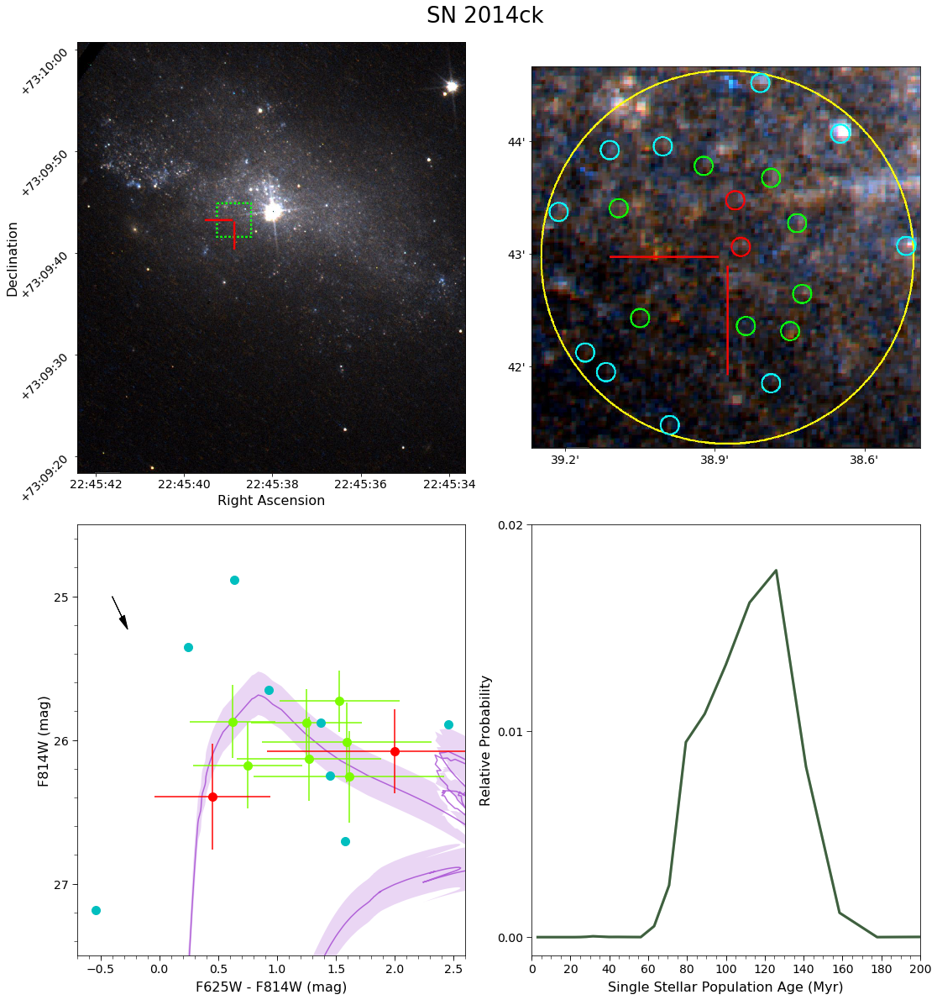

In [67]:
from matplotlib import gridspec
import matplotlib.image as im
from matplotlib.ticker import MultipleLocator
#from matplotlib_scalebar.scalebar import ScaleBar
#from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
from matplotlib.patches import Rectangle

# Setup figure and grid
fig = plt.figure(figsize=(18,20))
gs = gridspec.GridSpec(2, 2)
gs.update(wspace=0.17, hspace=0.12)

axis_font = {'size':'16'} # Sets font size
tick_font = {'size':'14'}

### Figure 0: Whole galaxy ###
ax0 = plt.subplot(gs[0,0])
image=im.imread(Iax_dir + '/new_files/sn2014ck/2014ck_4.5kpc.5kpc.JPG')
ax0.imshow(image)
# Setting the ticks
x_tick = 924/(42.420 - 33.626)
x_start = x_tick*.42
ax0.set_xticks([x_start, x_start + 2*x_tick, x_start + 4*x_tick, x_start + 6*x_tick, x_start + 8*x_tick])
ax0.set_xticklabels(['22:45:42', '22:45:40', '22:45:38', '22:45:36', '22:45:34'], **tick_font)
y_tick = 1024/(60.72 - 18.34)
y_start = y_tick*.72
ax0.set_yticks([y_start, y_start + 10*y_tick, y_start + 20*y_tick,
                y_start + 30*y_tick, y_start + 40*y_tick])
ax0.set_yticklabels(['+73:10:00', '+73:09:50', '+73:09:40', '+73:09:30', '+73:09:20'], rotation=45, **tick_font)

# Add scalebar
#scalebar = ScaleBar((21.23e6/x_tick))
#plt.gca().add_artist(scalebar)
#scalebar = AnchoredSizeBar(ax0.transData, x_tick/21.23e3, '1 kpc', loc=2)
#ax0.add_artist(scalebar)
#ax0.plot([500,800], [10,10], 'white', lw=10)
#ax0.plot([520, 520 + x_tick], [12,12], 'black', lw=2)
#scalebar = Rectangle((10, 500), 2, 10, edgecolor='white', facecolor='none'
#ax0.add_patch(scalebar)

# Setting labels
ax0.set_xlabel("Right Ascension", **axis_font)
ax0.set_ylabel("Declination", **axis_font)
ax0.xaxis.set_label_coords(.5, -.05)
#ax0.xaxis.set_ticks_position('none')
ax0.yaxis.set_label_coords(-.15, .5)
#ax0.yaxis.set_ticks_position('none')

### Figure 1: Zoom in on ROI ###
ax1 = plt.subplot(gs[0,1])
image=im.imread(Iax_dir + '/new_files/sn2014ck/2014ck_400pc.400pc.JPG')
ax1.imshow(image)
# Setting the ticks
x_tick = 1046/(39.267 - 38.488) #767
x_start = x_tick*.067
ax1.set_xticks([x_start, x_start + .3*x_tick, x_start + .6*x_tick])
ax1.set_xticklabels(["39.2'", "38.9'", "38.6'"], **tick_font)
y_tick = 1025/(44.66 - 41.27) #769
y_start = y_tick*.66
ax1.set_yticks([y_start, y_start + y_tick, y_start + 2*y_tick])
ax1.set_yticklabels(["44'", "43'", "42'"], **tick_font)
# Setting labels
ax1.xaxis.set_label_coords(.5, -.18)
#ax1.xaxis.set_ticks_position('none')
ax1.yaxis.set_label_coords(-.45, .5)
#ax1.yaxis.set_ticks_position('none')

### Figure 2: Color-magnitude diagram ###
ax2 = plt.subplot(gs[1,0])
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()
age_cmd = {}
ages = ages[(ages > 8.04) & (ages < 8.06)]
print(ages)
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Three adjustments: 1. Distance: added to mag 2. MW Extinction: added to both. 3. Galactic extinction
    dist_adjust = 5 * (np.log10(24.4e6) - 1)
    F625W_ext = 1.018 # extinction in F625W in UGC 12182 from NED
    F814W_ext = 0.700 # extinction in F814W in UGC 12182 from NED
    Gal_ext = 0
    mag = df[idx].WFC3_UVIS_F814W + dist_adjust + F814W_ext + 1.436*Gal_ext
    mag_lower = df[idx].WFC3_UVIS_F814W + dist_lower + F814W_ext + 1.436*red_lower
    mag_upper = df[idx].WFC3_UVIS_F814W + dist_upper + F814W_ext + 1.436*red_upper
    color = df[idx].WFC3_UVIS_F625W - df[idx].WFC3_UVIS_F814W + F625W_ext - F814W_ext + (2.259 - 1.436)*Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    ax2.plot(color, mag, alpha=0.7, color='darkorchid', zorder=0)
    ax2.fill_between(color, mag_lower, mag_upper, facecolor='darkorchid', alpha=0.2, edgecolor='none')
# Plots stars
#line2 = plt.plot(info[:,15] - info[:,28], info[:,28], 'go')

line1 = ax2.plot(info200[:,15] - info200[:,28], info200[:,28], 'co', markersize=10)
line2 = ax2.errorbar(info133[:,15] - info133[:,28], info133[:,28], color='lawngreen', marker='o', linestyle='',
                    xerr=np.sqrt(info133[:,17]**2 + info133[:,30]**2), yerr=info133[:,30], markersize=10)
line3 = ax2.errorbar(info67[:,15] - info67[:,28], info67[:,28], fmt='ro',
                     xerr=np.sqrt(info67[:,17]**2 + info67[:,30]**2), yerr=info67[:,30], markersize=10)
# Plots reddening vector
plt.arrow(-.4, 25, (2.259 - 1.436)*.1, 1.436*.1, head_width=0.05, head_length=0.1, fc='k', ec='k')
# Setting labels and axis range
ax2.set_xlabel("F625W - F814W (mag)", **axis_font)
ax2.set_ylabel("F814W (mag)", **axis_font)
ax2.xaxis.set_label_coords(.5, -.06)
ax2.yaxis.set_label_coords(-.065, .5)
ax2.set_ylim(27.5,24.5)
ax2.set_xlim(-.7, 2.6)
ax2.tick_params(axis='both', which='major', labelsize=14, length=6)
ax2.tick_params(axis='both', which='minor', length=4)
#ax2.set_yticks(np.arange(26, 29))
#ax2.set_xticks(np.arange(-.50,2,.5))
ax2.xaxis.set_major_locator(MultipleLocator(.5))
ax2.xaxis.set_minor_locator(MultipleLocator(.1))
ax2.yaxis.set_major_locator(MultipleLocator(1))
ax2.yaxis.set_minor_locator(MultipleLocator(.2))

### Figure 3: Probability distribution function ###
ax3 = plt.subplot(gs[1,1])
norm_linear = np.trapz(probs_tot, 10**(CChi[0, 0, :, 3, 0])/1e6)
ax3.plot(10**(CChi[0, 0, :, 3, 0])/1e6, probs_tot/norm_linear, 'g-', alpha=.5, linewidth=3)
ax3.plot(10**(CChi[0, 0, :, 3, 0])/1e6, probs_tot/norm_linear, 'k-', alpha=.5, linewidth=3)
# Setting labels and axis range
ax3.set_xlabel("Single Stellar Population Age (Myr)", **axis_font)
ax3.set_ylabel("Relative Probability", **axis_font)
ax3.xaxis.set_label_coords(.5, -.06)
ax3.yaxis.set_label_coords(-.1, .5)
ax3.set_xlim(0,200)
ax3.tick_params(axis='both', which='major', labelsize=14, length=6)
ax3.tick_params(axis='both', which='minor', length=4)
ax3.xaxis.set_major_locator(MultipleLocator(20))
ax3.xaxis.set_minor_locator(MultipleLocator(5))
ax3.set_yticks(np.arange(0, .03, .01));

plt.suptitle('SN 2014ck', y=.91, size=26)
plt.savefig('2014ck_Fig.pdf', dpi=1000)

88.6216216216
113.594594595
134.702702703


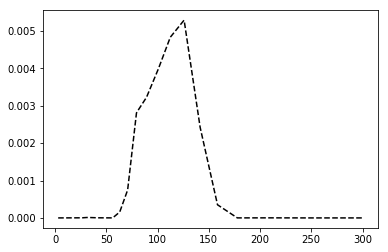

In [20]:
x_interp = np.linspace(3, 300, 1000)
pdf_interp = np.interp(x_interp, (10**CChi[0,0,:,3,0])/1e6, probs_tot[:])

plt.plot(x_interp, pdf_interp/np.sum(pdf_interp), 'k--')

cdf_array = np.zeros([pdf_interp.shape[0], 2])
for i in range(pdf_interp.shape[0]):
    cdf_array[i,0] = x_interp[i]
    cdf_array[i,1] = np.sum(pdf_interp[:i+1])/np.sum(pdf_interp[:])
    
print(cdf_array[:,0][np.argmin(np.abs(cdf_array[:,1] - (1 - .6827)/2.))])
print(cdf_array[:,0][np.argmin(np.abs(cdf_array[:,1] - .5))])
print(cdf_array[:,0][np.argmin(np.abs(cdf_array[:,1] - (1 + .6827)/2.))])

## False Star Tests

In [21]:
x_pos = 2265 + 90*np.random.rand(50)
y_pos = 1820 + 90*np.random.rand(50)

f435w_mags = 17 + 12*np.random.rand(1000) # Range of 17 to 29 in mag
Iax_dir = "/Users/tktakaro/Documents/Type-Iax-HST"
file = open(Iax_dir + "/new_files/sn2014ck/fake_stars.list", "w+")
for j in range(x_pos.size):
    for i in range(f435w_mags.size):
        file.write('0 1 {x} {y} {f4} {f4} {f4} {f4}\n'.format(x=x_pos[j], y=y_pos[j], f4=f435w_mags[i]))
file.close()

In [22]:
f435w_counts = 21.8 * 10**((2.982 - f435w_mags))
file = open(Iax_dir + "/new_files/sn2014ck/fake_stars_counts.list", "w+")
for j in range(x_pos.size):
    for i in range(f435w_counts.size):
        file.write('0 1 {x} {y} {f4} {f4} {f4} {f4}\n'.format(x=x_pos[j], y=y_pos[j], f4=f435w_counts[i]))
file.close()

In [23]:
# Loading in the false star test
catalog_false_f625w = np.loadtxt(Iax_dir + "/new_files/sn2014ck/sn2014ck_f625w.fake")
catalog_false_f814w = np.loadtxt(Iax_dir + "/new_files/sn2014ck/sn2014ck_f814w.fake")

In [24]:
recovered_mags = np.zeros([50000,13]) # 1. X position, 2. Y position, 3. Inserted Mag, 4. Recovered mag (f435w),
# 5. S/N (f435w), 6. Sharpness (f435w), 7. Roundness (f435w), 8. Crowding (f435w), 9.+ same, for other filters
for i in range(catalog_false_f625w.shape[0]):
    # X, Y, and Inserted Magnitude
    recovered_mags[i,0] = catalog_false_f625w[i,2]
    recovered_mags[i,1] = catalog_false_f625w[i,3]
    recovered_mags[i,2] = catalog_false_f625w[i,5]
    # Recovered mag in F625W
    if (catalog_false_f625w[i,14] == 0) and (catalog_false_f625w[i,15] == 0):
        recovered_mags[i,3] = 99.999
    else:
        recovered_mags[i,3] = catalog_false_f625w[i,27]
        recovered_mags[i,4:8] = catalog_false_f625w[i,17:21]
    # Recovered mag in F814W
    if (catalog_false_f814w[i,14] == 0) and (catalog_false_f814w[i,15] == 0):
        recovered_mags[i,8] = 99.999
    else:
        recovered_mags[i,8] = catalog_false_f814w[i,27]
        recovered_mags[i,9:13] = catalog_false_f814w[i,17:21]

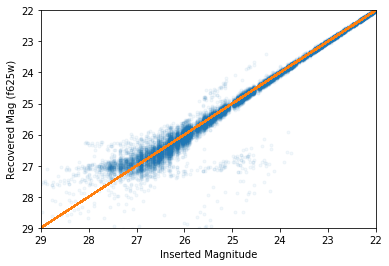

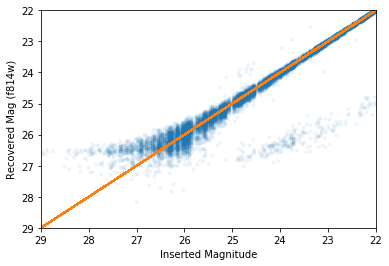

In [25]:
plt.plot(recovered_mags[:,2], recovered_mags[:,3], '.', alpha=.05)
plt.plot(recovered_mags[:,2], recovered_mags[:,2], '--')
plt.ylim(29,22)
plt.xlim(29,22)
plt.xlabel("Inserted Magnitude")
plt.ylabel("Recovered Mag (f625w)")
plt.show()

plt.plot(recovered_mags[:,2], recovered_mags[:,8], '.', alpha=.05)
plt.plot(recovered_mags[:,2], recovered_mags[:,2], '--')
plt.ylim(29,22)
plt.xlim(29,22)
plt.xlabel("Inserted Magnitude")
plt.ylabel("Recovered Mag (f814w)")
plt.show()

In [26]:
f625w_mags = []
f625w_recover = []
f814w_mags = []
f814w_recover = []
# Calculate recovery percentage as a function of inserted mag
for i in range(catalog_false_f625w.shape[0]):
    f625w_mags.append(recovered_mags[i,2])
    f814w_mags.append(recovered_mags[i,2])
    if abs(recovered_mags[i,2] - recovered_mags[i,3]) < .5:
        f625w_recover.append(recovered_mags[i,2])
    if abs(recovered_mags[i,2] - recovered_mags[i,8]) < .5:
        f814w_recover.append(recovered_mags[i,2])

In [27]:
# Setting up the histogram bins w/ .1 mag resolution
b = []
for i in range(121):
    b.append(17 + i/10.)

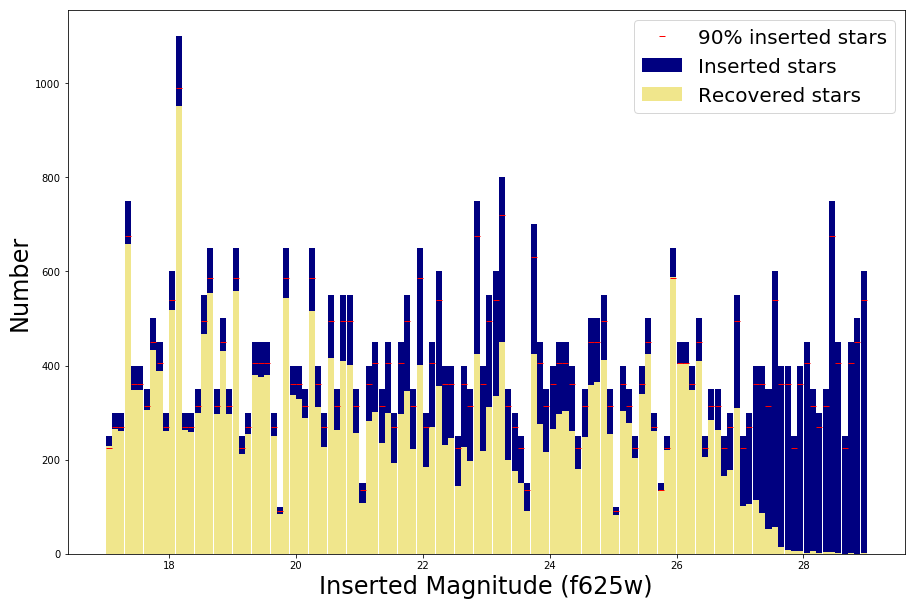

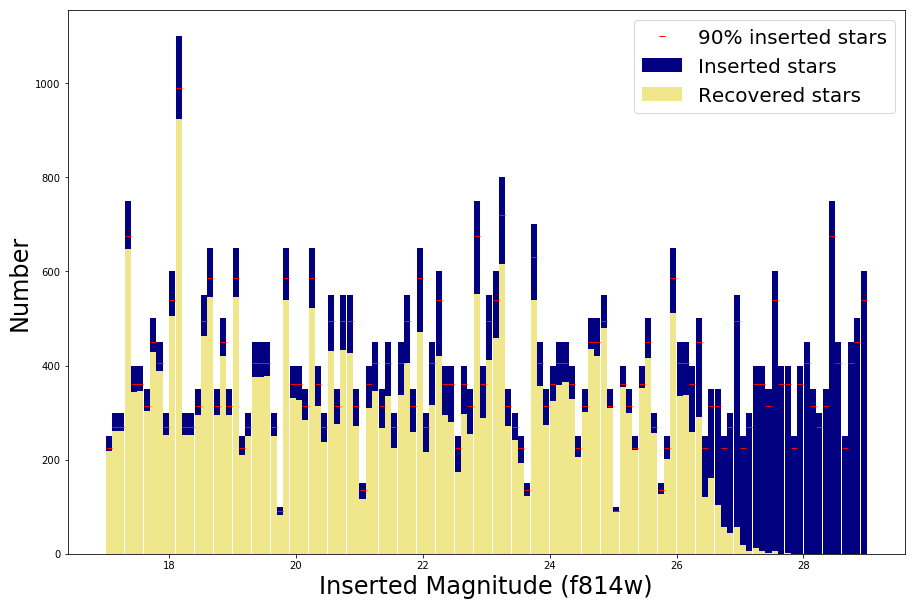

In [28]:
#b = [17,17.5,18,18.5,19,19.5,20,20.5,21,21.5,22,22.5,23,23.5,24,24.5,25,25.5,26,26.5,27,27.5,28,28.5,29,29.5,30]
plt.subplots(figsize=(15, 10))
h6 = plt.hist(f625w_mags, bins=b, facecolor='navy', rwidth=.95, label='Inserted stars')
r6 = plt.hist(f625w_recover, bins=b, rwidth=.95, facecolor='khaki', label='Recovered stars')
plt.plot(h6[1][:-1]+.05, .9*h6[0], 'r_', markersize=6, label='90% inserted stars')
plt.xlabel("Inserted Magnitude (f625w)", fontsize=24)
plt.ylabel("Number", fontsize=24)
plt.legend(fontsize=20)
plt.show()

plt.subplots(figsize=(15, 10))
h8 = plt.hist(f814w_mags, bins=b, facecolor='navy', rwidth=.95, label='Inserted stars')
r8 = plt.hist(f814w_recover, bins=b, rwidth=.95, facecolor='khaki', label='Recovered stars')
plt.plot(h8[1][:-1]+.05, .9*h8[0], 'r_', markersize=6, label='90% inserted stars')
plt.xlabel("Inserted Magnitude (f814w)", fontsize=24)
plt.ylabel("Number", fontsize=24)
plt.legend(fontsize=20)
plt.show()

frac_f625w = r6[0]/h6[0]
frac_f814w = r8[0]/h8[0]

26.05
24.95


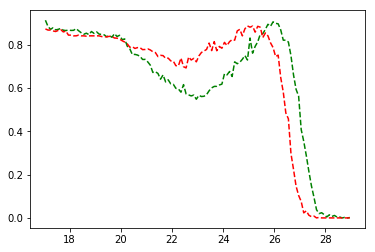

In [29]:
from scipy.interpolate import interp1d

plt.plot(h6[1][:-1]+.05, frac_f625w, 'g--')
plt.plot(h8[1][:-1]+.05, frac_f814w, 'r--')

print(h6[1][:-1][np.argmin(abs(frac_f625w - .9))] + .05)
print(h8[1][:-1][np.argmin(abs(frac_f814w - .9))] + .05)

In [30]:
# Save recovery fractions and associated magnitudes in two numpy arrays
frac_array = np.array([frac_f625w, frac_f814w])
bin_array = np.array([h6[1], h8[1]])
np.save('14ck_frac.npy', frac_array)
np.save('14ck_bins.npy', bin_array)

In [36]:
bin_12Z = np.array([h6[1], h6[1], h6[1]])
np.save('12Z_bins.npy', bin_12Z)